### Imports 

In [62]:

# Импорт необходимых библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa import stattools
from statsmodels.graphics import tsaplots
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.stattools import acf, pacf

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from arch import arch_model
from prophet import Prophet
import arch

import itertools
from itertools import product

# Настройка параметров визуализации
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12

# Базовые библиотеки для работы с данными
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Статистические тесты и функции
from scipy import stats
from statsmodels.tsa.stattools import adfuller, acf, pacf

# Модели машинного обучения
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, LassoCV, RidgeCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel

# XGBoost
from xgboost import XGBRegressor

# Модели временных рядов
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing, SimpleExpSmoothing
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Для GARCH моделей
import arch
from arch import arch_model

# Для визуализации
import matplotlib.dates as mdates
from IPython.display import display

# Для обработки ошибок и таймаутов
import sys
import os
import time
import signal
from contextlib import contextmanager

ModuleNotFoundError: No module named 'xgboost'


## 1. Загрузка и первичный анализ данных



In [3]:
def load_data(sales_path, calendar_path, prices_path, store_id='STORE_1'):
    """
    Загрузка исходных данных.
    
    Args:
        sales_path: Путь к файлу с данными о продажах
        calendar_path: Путь к файлу с календарными данными
        prices_path: Путь к файлу с данными о ценах
        store_id: ID магазина для анализа
    
    Returns:
        Кортеж из трех датафреймов (sales, calendar, prices)
    """
    # Загрузка данных
    sales = pd.read_csv('data/shop_sales.csv')
    calendar = pd.read_csv('data/shop_sales_dates.csv')
    prices = pd.read_csv('data/shop_sales_prices.csv')
    
    # Фильтрация данных по выбранному магазину
    sales = sales[sales['store_id'] == store_id]
    prices = prices[prices['store_id'] == store_id]
    
    # Преобразование даты в формат datetime
    calendar['date'] = pd.to_datetime(calendar['date'])
    
    print(f"Данные загружены. Магазин {store_id} содержит {len(sales['item_id'].unique())} товаров.")
    
    return sales, calendar, prices

# Загрузка данных
sales, calendar, prices = load_data('sales.csv', 'calendar.csv', 'prices.csv')

# Первичный анализ данных
print("\nИнформация о данных продаж:")
print(sales.info())
print("\nПервые 5 строк данных продаж:")
print(sales.head())

print("\nИнформация о календарных данных:")
print(calendar.info())
print("\nПервые 5 строк календарных данных:")
print(calendar.head())

print("\nИнформация о данных цен:")
print(prices.info())
print("\nПервые 5 строк данных цен:")
print(prices.head())

Данные загружены. Магазин STORE_1 содержит 15 товаров.

Информация о данных продаж:
<class 'pandas.core.frame.DataFrame'>
Index: 27285 entries, 54570 to 81854
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   item_id   27285 non-null  object
 1   store_id  27285 non-null  object
 2   date_id   27285 non-null  int64 
 3   cnt       27285 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 1.0+ MB
None

Первые 5 строк данных продаж:
           item_id store_id  date_id  cnt
54570  STORE_1_064  STORE_1        1    0
54571  STORE_1_064  STORE_1        2    1
54572  STORE_1_064  STORE_1        3    0
54573  STORE_1_064  STORE_1        4    0
54574  STORE_1_064  STORE_1        5    0

Информация о календарных данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1819 entries, 0 to 1818
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----    

## 2. Разведочный анализ данных (EDA)

- Проверка на стационарность (тест Дики-Фуллера)
Что делает: Применяет расширенный тест Дики-Фуллера для проверки стационарности временного ряда.
Почему это важно:
Стационарность - ключевое свойство для многих моделей временных рядов (особенно ARIMA/ARMA)
Стационарный ряд имеет постоянное среднее, дисперсию и автокорреляционную структуру
Нестационарные ряды требуют дополнительной обработки (дифференцирование, удаление тренда)
Выводы, которые можно сделать:
Если p-value < 0.05, ряд стационарен - можно применять ARMA модели напрямую
Если p-value ≥ 0.05, ряд нестационарен - требуется дифференцирование или другие преобразования
Соотношение стационарных и нестационарных рядов среди товаров помогает выбрать общую стратегию моделирования

3.2 Выявление аномалий (метод Z-score)
Что делает: Вычисляет Z-score для каждой точки временного ряда и выявляет аномалии (значения, отклоняющиеся более чем на 3 стандартных отклонения от среднего).
Почему это важно:
Аномалии могут сильно искажать результаты моделирования
Аномалии часто указывают на особые события (акции, праздники, проблемы с поставками)
Количество аномалий характеризует "шумность" временного ряда
Выводы, которые можно сделать:
Товары с большим количеством аномалий могут требовать специальной обработки
Аномалии могут указывать на сезонные распродажи или другие регулярные события
Высокая доля аномалий может свидетельствовать о нестабильности спроса

3.3 Визуализация временного ряда
Что делает: Строит график временного ряда продаж.
Почему это важно:
Визуальный анализ - мощный инструмент для выявления паттернов
Позволяет быстро обнаружить тренды, сезонность, структурные изменения и выбросы
Выводы, которые можно сделать:
Наличие и направление тренда (рост, падение, стабильность)
Наличие сезонности (недельной, месячной, годовой)
Структурные изменения (резкие изменения уровня или характера продаж)
Визуальное подтверждение аномалий

3.4 Анализ автокорреляции и частичной автокорреляции
Что делает: Строит графики автокорреляционной функции (ACF) и частичной автокорреляционной функции (PACF).
Почему это важно:
ACF показывает корреляцию между текущими и прошлыми значениями ряда
PACF показывает прямую корреляцию между текущими и прошлыми значениями, исключая опосредованное влияние
Эти графики критически важны для определения параметров ARIMA/ARMA моделей
Выводы, которые можно сделать:
Значимые лаги в ACF указывают на сезонность и компоненту скользящего среднего (MA)
Значимые лаги в PACF указывают на авторегрессионную компоненту (AR)
Характер затухания ACF и PACF помогает определить порядок модели ARIMA
Недельная сезонность часто проявляется как пики на лагах 7, 14, 21 и т.д.

3.5 Декомпозиция временного ряда

Что делает: Разлагает временной ряд на три компонента: тренд, сезонность и остатки.
Почему это важно:
Позволяет отдельно анализировать каждый компонент временного ряда
Помогает понять структуру ряда и выбрать подходящую модель
Выявляет скрытые паттерны, которые могут быть не видны на исходном ряде
Выводы, которые можно сделать:
Характер тренда (линейный, нелинейный, отсутствие тренда)
Сила и стабильность сезонного компонента
Случайность остатков (если остатки имеют структуру, модель декомпозиции неполна)
Аддитивная или мультипликативная природа ряда

In [19]:
def perform_eda(sales_data, calendar_data, prices_data, store_id='STORE_1'):
    """
    Проводит разведочный анализ данных для временных рядов продаж
    
    Parameters:
    -----------
    sales_data : DataFrame
        Данные о продажах
    calendar_data : DataFrame
        Календарные данные
    prices_data : DataFrame
        Данные о ценах
    store_id : str
        Идентификатор магазина для анализа
    
    Returns:
    --------
    dict
        Словарь с результатами анализа
    """
    # Выводим информацию о структуре данных
    print("Структура данных о продажах:")
    print(sales_data.columns)
    print("\nСтруктура календарных данных:")
    print(calendar_data.columns)
    print("\nСтруктура данных о ценах:")
    print(prices_data.columns)
    
    # Фильтрация данных по магазину
    if 'store_id' in sales_data.columns:
        store_sales = sales_data[sales_data['store_id'] == store_id].copy()
    else:
        store_sales = sales_data.copy()
        print("Внимание: В данных о продажах нет столбца store_id. Используем все данные о продажах.")
    
    # Определяем столбец с датой
    date_id_col = None
    if 'date_id' in store_sales.columns and 'date_id' in calendar_data.columns:
        date_id_col = 'date_id'
    else:
        # Ищем альтернативное название столбца с датой
        date_cols = [col for col in store_sales.columns if 'date' in col.lower()]
        calendar_date_cols = [col for col in calendar_data.columns if 'date' in col.lower()]
        common_date_cols = set(date_cols).intersection(set(calendar_date_cols))
        
        if common_date_cols:
            date_id_col = list(common_date_cols)[0]
            print(f"Используем '{date_id_col}' вместо 'date_id'")
        else:
            # Если нет общего столбца с датой, используем первый столбец с датой из данных о продажах
            if date_cols:
                date_id_col = date_cols[0]
                print(f"Внимание: Нет общего столбца с датой. Используем '{date_id_col}' из данных о продажах.")
            else:
                print("Ошибка: Не найден столбец с датой в данных о продажах.")
                return {}, pd.DataFrame()
    
    # Определяем столбец с ценой
    price_col = None
    if 'price' in prices_data.columns:
        price_col = 'price'
    else:
        # Ищем альтернативное название столбца с ценой
        price_cols = [col for col in prices_data.columns if 'price' in col.lower() or 'cost' in col.lower()]
        if price_cols:
            price_col = price_cols[0]
            print(f"Используем '{price_col}' вместо 'price'")
        else:
            print("Внимание: Не найден столбец с ценой в данных о ценах.")
    
    # Определяем столбец с количеством продаж
    sales_col = None
    if 'cnt' in store_sales.columns:
        sales_col = 'cnt'
    else:
        # Ищем альтернативное название столбца с продажами
        sales_cols = [col for col in store_sales.columns if any(x in col.lower() for x in ['cnt', 'sales', 'sold', 'quantity'])]
        if sales_cols:
            sales_col = sales_cols[0]
            print(f"Используем '{sales_col}' вместо 'cnt'")
        else:
            print("Ошибка: Не найден столбец с количеством продаж.")
            return {}, pd.DataFrame()
    
    # Объединение данных
    try:
        # Сначала объединяем с календарем
        if date_id_col in calendar_data.columns:
            data = store_sales.merge(
                calendar_data[[date_id_col, 'date'] if 'date' in calendar_data.columns else date_id_col], 
                on=date_id_col, how='left'
            )
        else:
            data = store_sales.copy()
            print("Внимание: Не удалось объединить с календарными данными.")
        
        # Затем объединяем с ценами, если есть столбец с ценой
        if price_col is not None:
            # Определяем общие столбцы для объединения
            common_cols = set(data.columns).intersection(set(prices_data.columns)) - {price_col}
            if 'item_id' in common_cols and date_id_col in common_cols:
                data = data.merge(
                    prices_data[['item_id', date_id_col, price_col]], 
                    on=['item_id', date_id_col], how='left'
                )
            else:
                print(f"Внимание: Не удалось объединить с данными о ценах.")
    except Exception as e:
        print(f"Ошибка при объединении данных: {str(e)}")
        # Используем только данные о продажах
        data = store_sales.copy()
    
    # Преобразование даты
    if 'date' in data.columns:
        if not pd.api.types.is_datetime64_any_dtype(data['date']):
            data['date'] = pd.to_datetime(data['date'])
    else:
        # Если нет столбца 'date', пытаемся использовать date_id_col
        if date_id_col in data.columns:
            data['date'] = pd.to_datetime(data[date_id_col])
        else:
            print("Внимание: Не удалось создать столбец с датой.")
    
    # Анализ стационарности и выявление аномалий
    results = {}
    
    if 'item_id' in data.columns:
        items = data['item_id'].unique()
    else:
        # Если нет столбца item_id, создаем фиктивный
        print("Внимание: Не найден столбец item_id. Анализируем все данные как один товар.")
        data['item_id'] = 'ITEM_ALL'
        items = ['ITEM_ALL']
    
    for item in items:
        if 'item_id' in data.columns:
            item_data = data[data['item_id'] == item]
        else:
            item_data = data
        
        if 'date' in item_data.columns:
            item_data = item_data.sort_values('date')
        
        # Проверка на стационарность
        try:
            ts = item_data[sales_col]
            result = sm.tsa.adfuller(ts.dropna())
            p_value = result[1]
            is_stationary = p_value < 0.05
        except Exception as e:
            print(f"Ошибка при проверке стационарности для товара {item}: {str(e)}")
            p_value = None
            is_stationary = None
        
        # Выявление аномалий
        try:
            z_scores = stats.zscore(ts.dropna(), nan_policy='omit')
            anomalies = abs(z_scores) > 3
            anomaly_count = sum(anomalies)
        except Exception as e:
            print(f"Ошибка при выявлении аномалий для товара {item}: {str(e)}")
            anomaly_count = None
        
        results[item] = {
            'is_stationary': is_stationary,
            'p_value': p_value,
            'anomaly_count': anomaly_count
        }
        
        # Визуализация временного ряда
        try:
            if 'date' in item_data.columns:
                plt.figure(figsize=(12, 6))
                plt.plot(item_data['date'], item_data[sales_col])
                plt.title(f'Временной ряд продаж товара {item}')
                plt.xlabel('Дата')
                plt.ylabel('Продажи')
                plt.grid(True)
                plt.show()
                
                # Автокорреляция
                fig, ax = plt.subplots(1, 2, figsize=(15, 5))
                tsaplots.plot_acf(ts.dropna(), lags=30, ax=ax[0])
                ax[0].set_title(f'Автокорреляция для товара {item}')
                
                tsaplots.plot_pacf(ts.dropna(), lags=30, ax=ax[1])
                ax[1].set_title(f'Частичная автокорреляция для товара {item}')
                plt.tight_layout()
                plt.show()
                
                # Декомпозиция с недельной сезонностью
                try:
                    decomposition = sm.tsa.seasonal_decompose(ts.dropna(), model='additive', period=7)
                    
                    fig, axes = plt.subplots(4, 1, figsize=(14, 10))
                    decomposition.observed.plot(ax=axes[0])
                    axes[0].set_title(f'Товар {item} - Исходный ряд')
                    decomposition.trend.plot(ax=axes[1])
                    axes[1].set_title('Тренд')
                    decomposition.seasonal.plot(ax=axes[2])
                    axes[2].set_title('Недельная сезонность')
                    decomposition.resid.plot(ax=axes[3])
                    axes[3].set_title('Остатки')
                    
                    plt.tight_layout()
                    plt.show()
                except Exception as e:
                    print(f"Не удалось выполнить декомпозицию для товара {item}: {str(e)}")
        except Exception as e:
            print(f"Ошибка при визуализации для товара {item}: {str(e)}")
    
    # Подсчет стационарных и нестационарных рядов
    stationary_count = sum(1 for res in results.values() if res['is_stationary'])
    non_stationary_count = sum(1 for res in results.values() if res['is_stationary'] is not None and not res['is_stationary'])
    
    print(f"Стационарные ряды: {stationary_count}")
    print(f"Нестационарные ряды: {non_stationary_count}")
    
    # Создаем таблицу с результатами
    results_df = pd.DataFrame({
        'item_id': list(results.keys()),
        'is_stationary': [res['is_stationary'] for res in results.values()],
        'p_value': [res['p_value'] for res in results.values()],
        'anomaly_count': [res['anomaly_count'] for res in results.values()]
    })
    
    return results, results_df

Структура данных о продажах:
Index(['item_id', 'store_id', 'date_id', 'cnt'], dtype='object')

Структура календарных данных:
Index(['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1',
       'event_type_1', 'event_name_2', 'event_type_2', 'date_id',
       'CASHBACK_STORE_1', 'CASHBACK_STORE_2', 'CASHBACK_STORE_3'],
      dtype='object')

Структура данных о ценах:
Index(['store_id', 'item_id', 'wm_yr_wk', 'sell_price'], dtype='object')
Используем 'sell_price' вместо 'price'
Внимание: Не удалось объединить с данными о ценах.


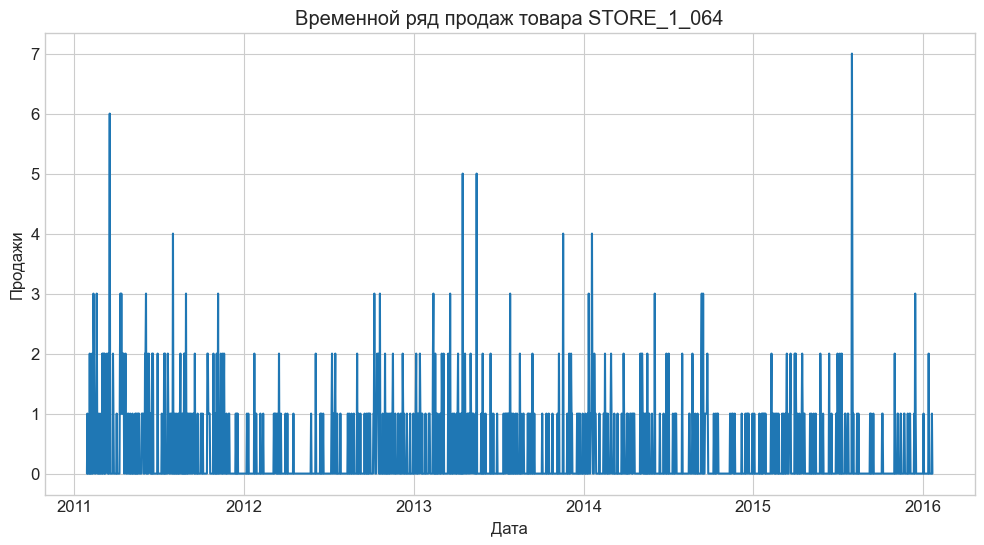

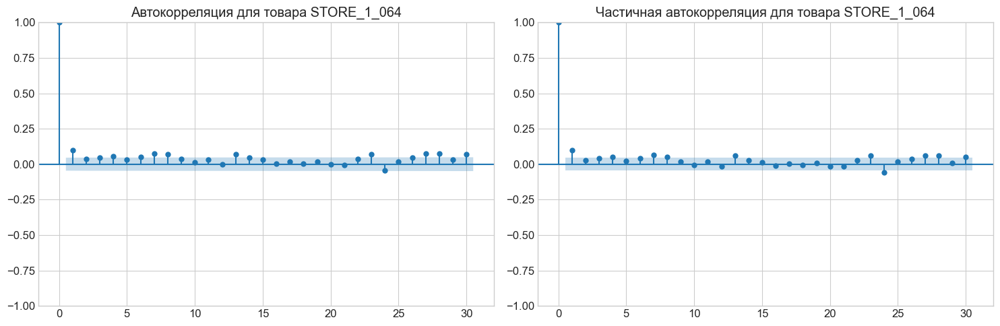

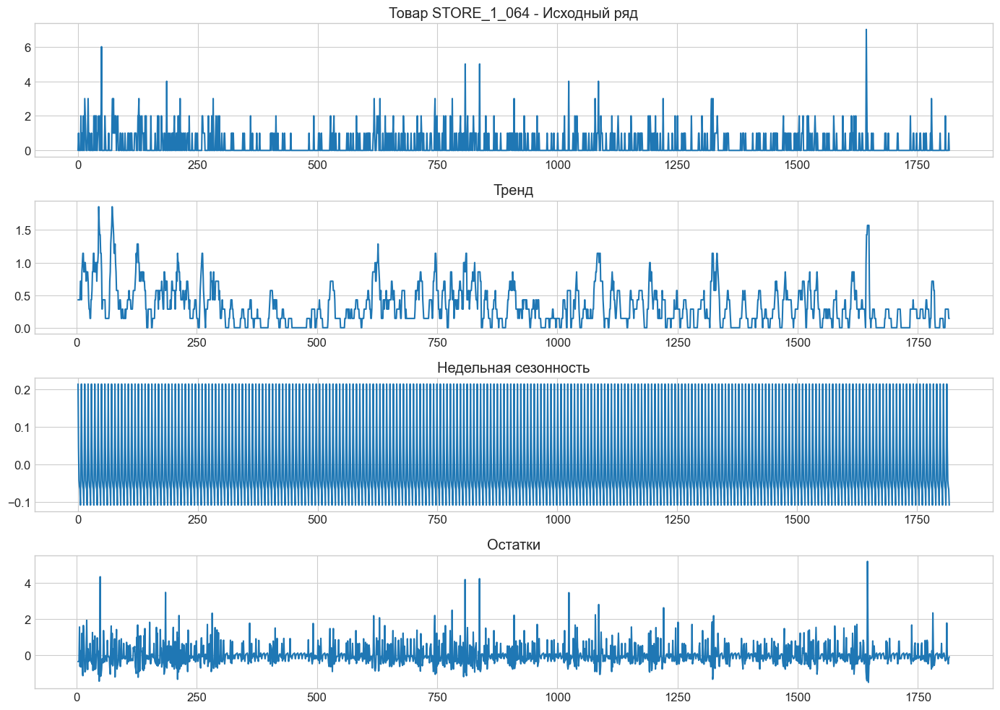

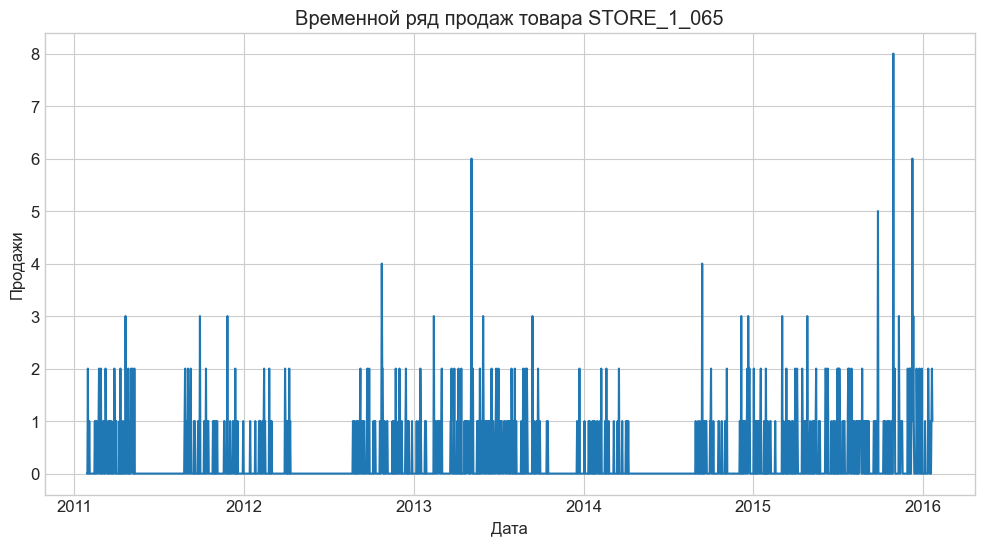

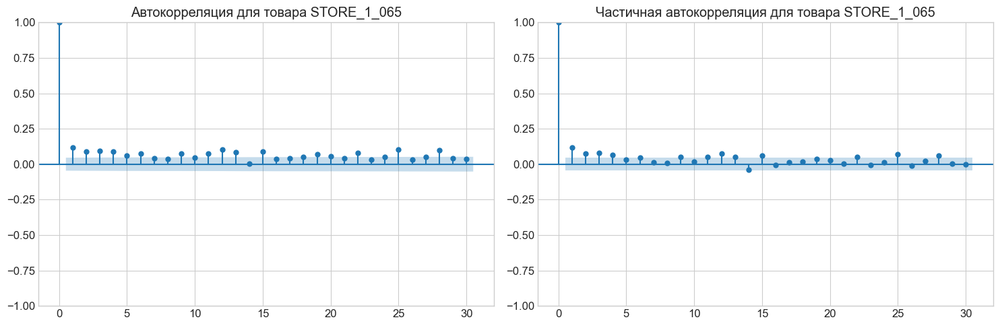

...

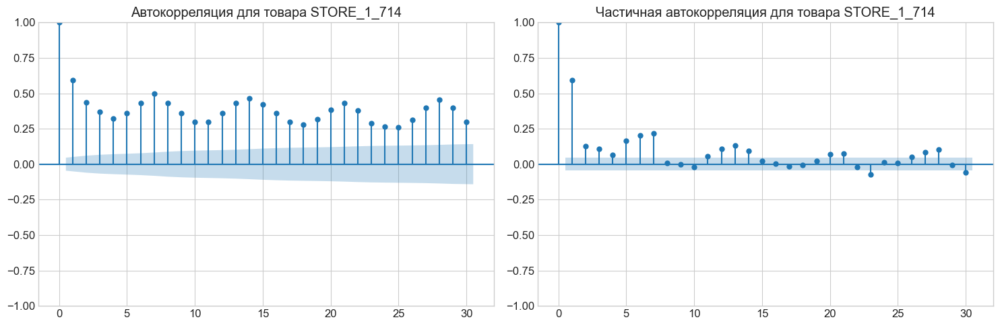

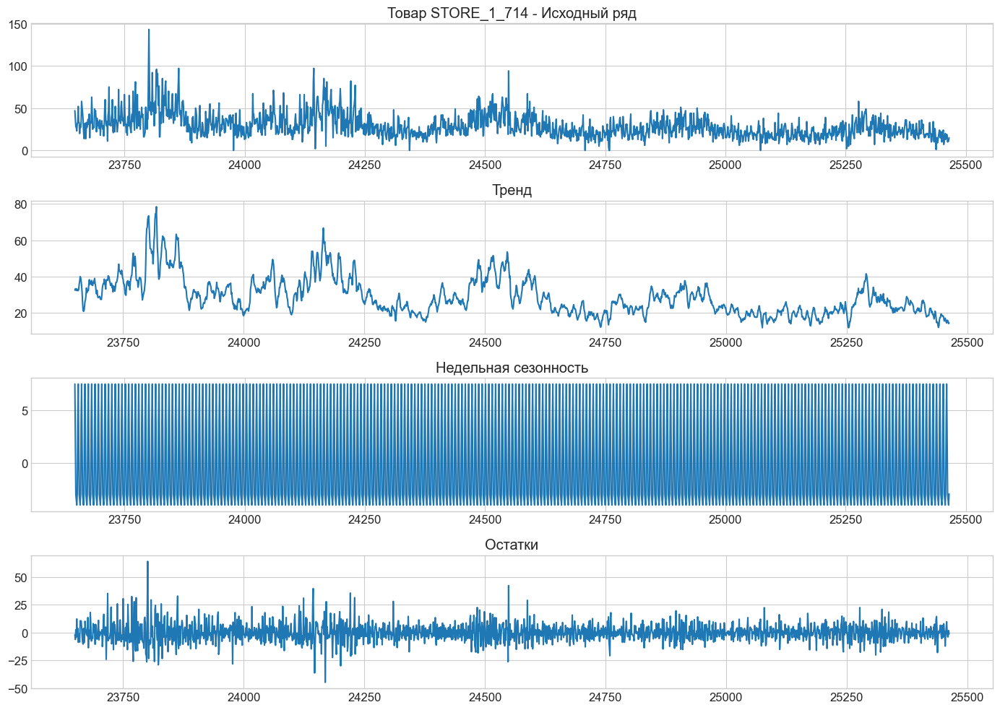

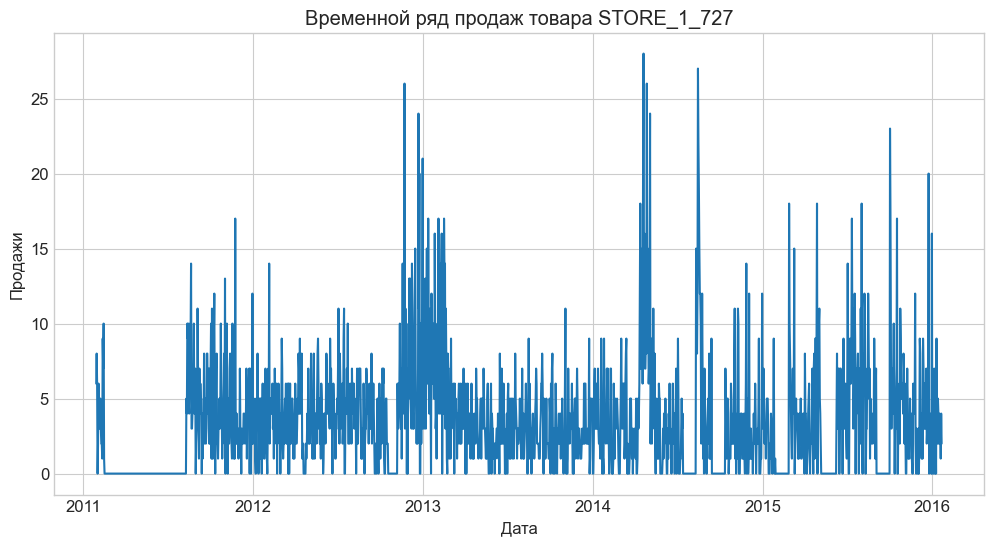

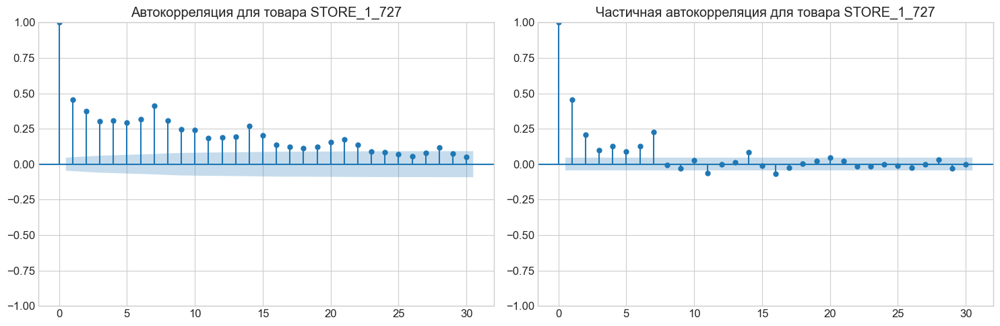

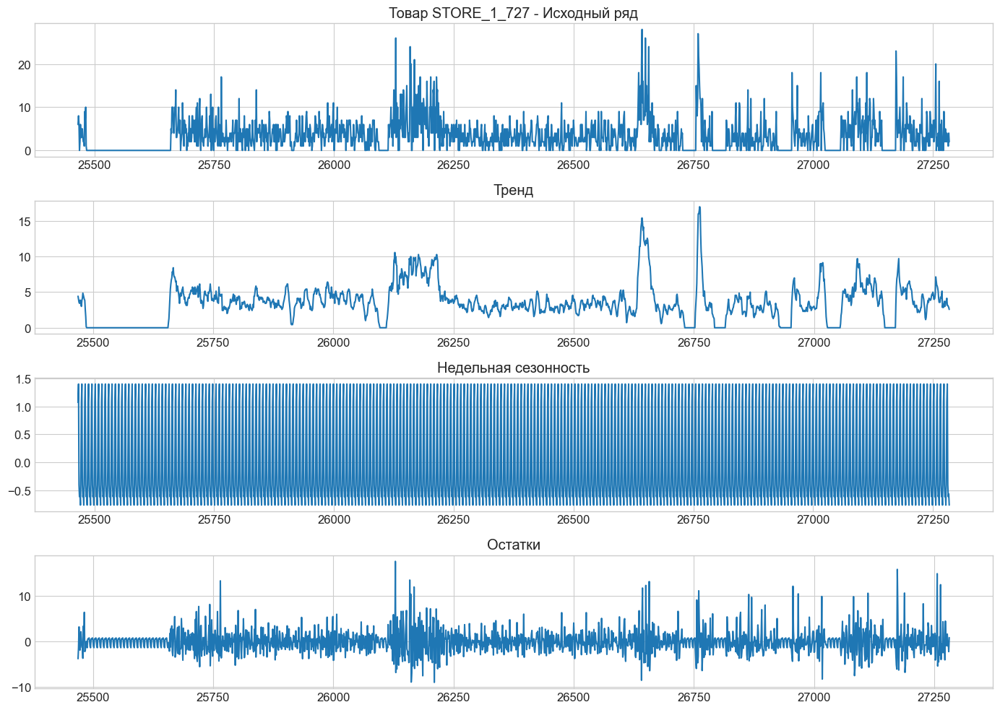

Стационарные ряды: 12
Нестационарные ряды: 3


In [22]:
eda_results, eda_summary = perform_eda(sales, calendar, prices)

Посмотрим на тренд и стационарность на графиках выше. Также проведем теста на стационарность:
- p-value < 0.05 означает, что ряд стационарен (можно отвергнуть нулевую гипотезу)
- p-value ≥ 0.05 означает, что ряд нестационарен (присутствует тренд или сезонность)

Видим, что у товаров 252, 555 и 586 не только высокий p-value, но и визуально просматривается нисходящий тренд. Так как большинство рядов стационарны (12 из 15), можно применять модели без предварительных преобразований для устранения тренда. Можно применять простые модели (AR, MA, ARMA) или использовать модели машинного обучения с лаговыми признаками.


Общие выводы из EDA
На основе проведенного разведочного анализа данных можно сделать следующие выводы:
О структуре временных рядов:
Стационарность/нестационарность рядов
Наличие и характер трендов
Наличие и сила сезонных компонентов
Присутствие аномалий и выбросов
2. О выборе моделей:
Для стационарных рядов подходят ARMA модели
Для рядов с трендом - модели с трендовой компонентой (ARIMA, ETS с трендом)
Для рядов с сезонностью - модели с сезонной компонентой (SARIMA, ETS с сезонностью, Prophet)
Для рядов с большим количеством аномалий - робастные модели (Prophet, динамическая регрессия)
О предобработке данных:
Необходимость дифференцирования для нестационарных рядов
Необходимость обработки аномалий
Потенциальная польза от логарифмирования (для рядов с мультипликативной структурой)
Необходимость учета внешних факторов (цены, праздники)
О стратегии прогнозирования:
Возможность единого подхода или необходимость индивидуальных моделей для каждого товара
Потенциальная польза от группировки товаров со схожими характеристиками
Необходимость учета взаимосвязей между товарами (замещение, комплементарность)

## 3. Предобработка данных 

Основные этапы предобработки:
1. Объединение данных из разных источников:
- Данные о продажах (sales_data)
- Календарные данные с информацией о праздниках (calendar_data)
- Данные о ценах (prices_data)
2. Обработка временных данных:
- Преобразование строковых дат в формат datetime
- Извлечение временных признаков: день недели, месяц, год, день месяца
- Создание бинарного признака выходных дней
3. Обработка аномалий:
- Выявление аномалий с использованием Z-score (значения, отклоняющиеся более чем на 3 стандартных отклонения)
- Замена аномальных значений на скользящее среднее за 7 дней
4. Создание инженерных признаков:
- Лаговые признаки продаж (1, 7, 14, 28 дней)
- Скользящие средние продаж (окна 7, 14, 28 дней)
- Бинарный признак наличия праздника
5. Обработка пропущенных значений:
- Заполнение пропусков в лаговых признаках средними значениями по товару
6. Кодирование категориальных признаков:
- One-hot кодирование для дня недели и месяца
7. Нормализация числовых признаков:
- Стандартизация числовых признаков для каждого товара отдельно

In [23]:
# Обновленная функция предобработки данных
def preprocess_data(sales_data, calendar_data, prices_data, store_id='STORE_1'):
    
    print("Структура данных о продажах:")
    print(sales_data.columns)
    print("\nСтруктура календарных данных:")
    print(calendar_data.columns)
    print("\nСтруктура данных о ценах:")
    print(prices_data.columns)
    
    
    store_sales = sales_data[sales_data['store_id'] == store_id].copy()

    # определяем поле для мерджа таблиц
    date_id_col = 'date_id'
    if date_id_col not in store_sales.columns:
        date_cols = [col for col in store_sales.columns if 'date' in col.lower()]
        if date_cols:
            date_id_col = date_cols[0]
            print(f"Используем '{date_id_col}' вместо 'date_id'")
        else:
            raise ValueError("Не найден столбец с датой в данных о продажах")
    
    price_col = 'price'
    if price_col not in prices_data.columns:
        price_cols = [col for col in prices_data.columns if 'price' in col.lower() or 'cost' in col.lower()]
        if price_cols:
            price_col = price_cols[0]
            print(f"Используем '{price_col}' вместо 'price'")
        else:
            print("Внимание: Не найден столбец с ценой в данных о ценах. Цена не будет использоваться.")
            price_col = None
    
    if 'store_id' in prices_data.columns:
        store_prices = prices_data[prices_data['store_id'] == store_id].copy()
    else:
        store_prices = prices_data.copy()
        print("Внимание: В данных о ценах нет столбца store_id. Используем все данные о ценах.")
    
    # Объединение данных
    if date_id_col in calendar_data.columns:
        data = store_sales.merge(
            calendar_data, on=date_id_col, how='left'
        )
    else:
        common_cols = set(store_sales.columns).intersection(set(calendar_data.columns))
        if common_cols:
            merge_col = list(common_cols)[0]
            print(f"Объединяем данные по столбцу '{merge_col}'")
            data = store_sales.merge(
                calendar_data, on=merge_col, how='left'
            )
        else:
            print("Внимание: Не найдены общие столбцы между данными о продажах и календарем.")
            data = store_sales.copy()
    if price_col is not None:
        common_cols = set(data.columns).intersection(set(store_prices.columns)) - {price_col}
        if 'item_id' in common_cols and date_id_col in common_cols:
            data = data.merge(
                store_prices[[*common_cols, price_col]], 
                on=list(common_cols), how='left'
            )
        else:
            print(f"Внимание: Не найдены необходимые общие столбцы для объединения с ценами.")
            # Добавляем фиктивный столбец цены
            data[price_col] = 1.0
    
    # Проверяем наличие столбца с датой
    if 'date' not in data.columns:
        if date_id_col in data.columns and date_id_col != 'date':
            try:
                data['date'] = pd.to_datetime(data[date_id_col])
                print(f"Создали столбец 'date' из '{date_id_col}'")
            except:
                print("Создаем искусственную дату на основе порядкового номера")
                data = data.sort_values(date_id_col)
                start_date = pd.Timestamp('2020-01-01')
                data['date'] = [start_date + pd.Timedelta(days=i) for i in range(len(data))]
        else:
            # Если нет date_id, создаем искусственную дату
            print("Создаем искусственную дату")
            data['date'] = pd.date_range(start='2020-01-01', periods=len(data))
    else:
        # Преобразуем дату в формат datetime, если она еще не в этом формате
        if not pd.api.types.is_datetime64_any_dtype(data['date']):
            data['date'] = pd.to_datetime(data['date'])
    
    # Создание временных признаков
    data['day_of_week'] = data['date'].dt.dayofweek
    data['month'] = data['date'].dt.month
    data['year'] = data['date'].dt.year
    data['day'] = data['date'].dt.day
    data['is_weekend'] = data['day_of_week'].isin([5, 6]).astype(int)
    
    # Проверяем наличие столбца с информацией о праздниках
    if 'event_name_1' in data.columns:
        data['is_holiday'] = data['event_name_1'].notna().astype(int)
    else:
        # Если нет информации о праздниках, создаем фиктивный признак
        print("Внимание: Нет информации о праздниках. Создаем фиктивный признак.")
        data['is_holiday'] = 0
    
    # Проверяем наличие столбца с количеством продаж
    sales_col = 'cnt'
    if sales_col not in data.columns:
        sales_cols = [col for col in data.columns if any(x in col.lower() for x in ['cnt', 'sales', 'sold', 'quantity'])]
        if sales_cols:
            sales_col = sales_cols[0]
            print(f"Используем '{sales_col}' вместо 'cnt'")
        else:
            raise ValueError("Не найден столбец с количеством продаж")
    
    # Создание лаговых признаков для продаж
    for lag in [1, 7, 14, 28]:
        data[f'lag_{lag}'] = data.groupby('item_id')[sales_col].transform(
            lambda x: x.shift(lag)
        )
    
    # Создание признаков скользящего среднего
    for window in [7, 14, 28]:
        data[f'rolling_mean_{window}'] = data.groupby('item_id')[sales_col].transform(
            lambda x: x.rolling(window=window, min_periods=1).mean()
        )
    
    # Обработка аномалий с использованием Z-score
    data['z_score'] = data.groupby('item_id')[sales_col].transform(lambda x: stats.zscore(x, nan_policy='omit'))
    anomaly_mask = abs(data['z_score']) > 3
    
    # Заменяем аномальные значения на скользящее среднее
    for item in data['item_id'].unique():
        item_mask = (data['item_id'] == item) & anomaly_mask
        if item_mask.sum() > 0:
            data.loc[item_mask, sales_col] = data.loc[item_mask, 'rolling_mean_7']
    
    # Обработка пропущенных значений
    for lag in [1, 7, 14, 28]:
        lag_col = f'lag_{lag}'
        if lag_col in data.columns:
            data[lag_col] = data.groupby('item_id')[lag_col].transform(
                lambda x: x.fillna(x.mean())
            )
    
    # Кодирование категориальных признаков
    data = pd.get_dummies(data, columns=['day_of_week', 'month'], drop_first=True)
    
    # Нормализация числовых признаков
    num_features = []
    if price_col in data.columns:
        num_features.append(price_col)
    
    for lag in [1, 7, 14, 28]:
        lag_col = f'lag_{lag}'
        if lag_col in data.columns:
            num_features.append(lag_col)
    
    for window in [7, 14, 28]:
        roll_col = f'rolling_mean_{window}'
        if roll_col in data.columns:
            num_features.append(roll_col)
    
    if num_features:
        scaler = StandardScaler()
        for item in data['item_id'].unique():
            item_mask = data['item_id'] == item
            if item_mask.sum() > 0:
                # Проверяем наличие всех признаков для данного товара
                available_features = [f for f in num_features if f in data.columns and not data.loc[item_mask, f].isna().all()]
                if available_features:
                    data.loc[item_mask, available_features] = scaler.fit_transform(
                        data.loc[item_mask, available_features]
                    )
    
    # Переименовываем столбец с продажами в 'cnt', если он называется иначе
    if sales_col != 'cnt':
        data = data.rename(columns={sales_col: 'cnt'})
    
    return data

In [24]:
processed_data = preprocess_data(sales, calendar, prices)

Структура данных о продажах:
Index(['item_id', 'store_id', 'date_id', 'cnt'], dtype='object')

Структура календарных данных:
Index(['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1',
       'event_type_1', 'event_name_2', 'event_type_2', 'date_id',
       'CASHBACK_STORE_1', 'CASHBACK_STORE_2', 'CASHBACK_STORE_3'],
      dtype='object')

Структура данных о ценах:
Index(['store_id', 'item_id', 'wm_yr_wk', 'sell_price'], dtype='object')
Используем 'sell_price' вместо 'price'
Внимание: Не найдены необходимые общие столбцы для объединения с ценами.


In [26]:
processed_data.head(5)

,item_id,store_id,date_id,cnt,date,wm_yr_wk,weekday,wday,year,event_name_1,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,STORE_1_064,STORE_1,1,0.0,2011-01-29,11101,Saturday,1,2011,NaN,...,False,False,False,False,False,False,False,False,False,False
1,STORE_1_064,STORE_1,2,1.0,2011-01-30,11101,Sunday,2,2011,NaN,...,False,False,False,False,False,False,False,False,False,False
2,STORE_1_064,STORE_1,3,0.0,2011-01-31,11101,Monday,3,2011,NaN,...,False,False,False,False,False,False,False,False,False,False
3,STORE_1_064,STORE_1,4,0.0,2011-02-01,11101,Tuesday,4,2011,NaN,...,False,False,False,False,False,False,False,False,False,False
4,STORE_1_064,STORE_1,5,0.0,2011-02-02,11101,Wednesday,5,2011,NaN,...,False,False,False,False,False,False,False,False,False,False


In [29]:
items = sales[sales['store_id'] == 'STORE_1']['item_id'].unique()
print(f"Найдено {len(items)} товаров для анализа: {items}")

Найдено 15 товаров для анализа: ['STORE_1_064' 'STORE_1_065' 'STORE_1_325' 'STORE_1_376' 'STORE_1_090'
 'STORE_1_252' 'STORE_1_339' 'STORE_1_546' 'STORE_1_547' 'STORE_1_555'
 'STORE_1_584' 'STORE_1_586' 'STORE_1_587' 'STORE_1_714' 'STORE_1_727']


## 4. Модели 

#### ARMA

Почему выбрана эта модель:
- ARMA подходит для стационарных временных рядов, а большинство товаров (12 из 15) показали стационарность
- Модель хорошо улавливает краткосрочные зависимости в данных
- Простая интерпретируемость и низкие вычислительные затраты

Функция включает:
- Проверка стационарности
- Проверка на минимальное количество данных
-  Обработка пропусков
- Выявление аномалий

In [36]:
def train_arma_models(data, items, max_p=3, max_q=3, d=0):
    models = {}
    
    for item in items:
        print(f"Обучение ARMA/ARIMA модели для товара {item}...")
        
        # Фильтруем данные для текущего товара
        item_data = data[data['item_id'] == item].copy()
        
        if len(item_data) < 30:  # Проверка на минимальное количество наблюдений
            print(f"Недостаточно данных для обучения ARMA/ARIMA модели для товара {item} (найдено {len(item_data)} наблюдений, требуется минимум 30)")
            continue
        
        # Проверяем стационарность ряда
        try:
            result = sm.tsa.adfuller(item_data['cnt'].dropna())
            p_value = result[1]
            is_stationary = p_value < 0.05
            
            if not is_stationary and d == 0:
                print(f"Временной ряд для товара {item} нестационарен (p-value = {p_value:.4f}). Рекомендуется использовать ARIMA вместо ARMA.")
                # Можно автоматически установить d=1 для нестационарных рядов
                # d = 1
        except Exception as e:
            print(f"Ошибка при проверке стационарности для товара {item}: {str(e)}")
        
        # Подготовка данных для обучения
        train_data = item_data.sort_values('date')
        
        # Проверяем на наличие пропусков
        if train_data['cnt'].isna().any():
            print(f"Обнаружены пропуски в данных для товара {item}. Заполняем их средним значением.")
            train_data['cnt'] = train_data['cnt'].fillna(train_data['cnt'].mean())
        
        # Проверяем на наличие аномалий
        z_scores = stats.zscore(train_data['cnt'], nan_policy='omit')
        anomalies = abs(z_scores) > 3
        if anomalies.sum() > 0:
            print(f"Обнаружено {anomalies.sum()} аномалий в данных для товара {item}.")
        
        # Поиск оптимальных параметров ARMA/ARIMA
        best_aic = float('inf')
        best_order = None
        best_model = None
        
        # Перебираем различные комбинации параметров
        for p, q in itertools.product(range(max_p + 1), range(max_q + 1)):
            if p == 0 and q == 0:
                continue  # Пропускаем тривиальную модель
            
            try:
                # Обучаем модель с текущими параметрами
                model = ARIMA(train_data['cnt'], order=(p, d, q))
                model_fit = model.fit()
                
                # Вычисляем AIC
                aic = model_fit.aic
                
                # Обновляем лучшую модель, если текущая лучше
                if aic < best_aic:
                    best_aic = aic
                    best_order = (p, d, q)
                    best_model = model_fit
                    
                print(f"  ARIMA({p},{d},{q}) для товара {item}: AIC = {aic:.2f}")
            except Exception as e:
                print(f"  Не удалось обучить ARIMA({p},{d},{q}) для товара {item}: {str(e)}")
        
        if best_model is not None:
            print(f"Лучшая модель для товара {item}: ARIMA{best_order} с AIC = {best_aic:.2f}")
            
            # Проверка остатков модели
            try:
                residuals = best_model.resid
                
                # Тест Льюнга-Бокса на автокорреляцию остатков
                lb_test = sm.stats.acorr_ljungbox(residuals, lags=[10], return_df=True)
                lb_pvalue = lb_test.iloc[0, 1]
                
                if lb_pvalue < 0.05:
                    print(f"  Внимание: Остатки модели для товара {item} имеют значимую автокорреляцию (p-value = {lb_pvalue:.4f})")
                else:
                    print(f"  Остатки модели для товара {item} не имеют значимой автокорреляции (p-value = {lb_pvalue:.4f})")
                
                # Тест Харке-Бера на нормальность остатков
                jb_test = stats.jarque_bera(residuals.dropna())
                jb_pvalue = jb_test[1]
                
                if jb_pvalue < 0.05:
                    print(f"  Внимание: Остатки модели для товара {item} не распределены нормально (p-value = {jb_pvalue:.4f})")
                else:
                    print(f"  Остатки модели для товара {item} распределены нормально (p-value = {jb_pvalue:.4f})")
            except Exception as e:
                print(f"  Ошибка при анализе остатков модели для товара {item}: {str(e)}")
            
            # Сохраняем модель и данные
            models[item] = {
                'model': best_model,
                'order': best_order,
                'aic': best_aic,
                'data': train_data
            }
        else:
            print(f"Не удалось найти подходящую ARMA/ARIMA модель для товара {item}")
    
    return models

In [37]:
arma_models = train_arma_models(processed_data, items)

Обучение ARMA/ARIMA модели для товара STORE_1_064...
Обнаружено 91 аномалий в данных для товара STORE_1_064.
  ARIMA(0,0,1) для товара STORE_1_064: AIC = 3027.69
  ARIMA(0,0,2) для товара STORE_1_064: AIC = 3027.64
  ARIMA(0,0,3) для товара STORE_1_064: AIC = 3026.99
  ARIMA(1,0,0) для товара STORE_1_064: AIC = 3026.80
  ARIMA(1,0,1) для товара STORE_1_064: AIC = 2998.23
  ARIMA(1,0,2) для товара STORE_1_064: AIC = 2996.56
  ARIMA(1,0,3) для товара STORE_1_064: AIC = 2998.56
  ARIMA(2,0,0) для товара STORE_1_064: AIC = 3026.50
  ARIMA(2,0,1) для товара STORE_1_064: AIC = 2996.56
  ARIMA(2,0,2) для товара STORE_1_064: AIC = 2998.56
  ARIMA(2,0,3) для товара STORE_1_064: AIC = 3000.48
  ARIMA(3,0,0) для товара STORE_1_064: AIC = 3024.56
  ARIMA(3,0,1) для товара STORE_1_064: AIC = 2998.56
  ARIMA(3,0,2) для товара STORE_1_064: AIC = 3000.54
  ARIMA(3,0,3) для товара STORE_1_064: AIC = 2998.31
Лучшая модель для товара STORE_1_064: ARIMA(2, 0, 1) с AIC = 2996.56
  Остатки модели для товара

#### Линейный временной ряд

Почему выбрана эта модель:
- Простая базовая модель для выявления долгосрочных трендов
- Служит хорошей отправной точкой для сравнения с более сложными моделями
- Может быть эффективна для товаров с явным линейным трендом

In [7]:
def train_linear_trend_models(data, items):
    models = {}
    
    for item in items:
        item_data = data[data['item_id'] == item].sort_values('date')
        
        # Создаем числовой индекс для времени
        item_data = item_data.reset_index(drop=True)
        item_data['time_idx'] = np.arange(len(item_data))
        
        # Обучаем линейную регрессию
        X = item_data[['time_idx']]
        y = item_data['cnt']
        
        model = LinearRegression()
        model.fit(X, y)
        
        models[item] = {
            'model': model,
            'coef': model.coef_[0],
            'intercept': model.intercept_
        }
    
    return models

In [32]:
linear_trend_models = train_linear_trend_models(processed_data, items)

#### Динамическая регрессия 

Почему выбрана эта модель:
- Учитывает внешние факторы (цены, праздники, день недели)
- Может улавливать нелинейные зависимости благодаря использованию градиентного бустинга
- Хорошо работает с разнородными признаками

In [9]:
# def train_dynamic_regression_models(data, items):
#     models = {}
    
#     for item in items:
#         item_data = data[data['item_id'] == item].sort_values('date')
        
#         # Выбираем признаки для модели
#         features = ['price', 'is_weekend', 'is_holiday', 
#                    'lag_1', 'lag_7', 'rolling_mean_7']
        
#         # Добавляем dummy-переменные для дня недели и месяца
#         day_cols = [col for col in item_data.columns if col.startswith('day_of_week_')]
#         month_cols = [col for col in item_data.columns if col.startswith('month_')]
        
#         features.extend(day_cols)
#         features.extend(month_cols)
        
#         # Проверяем наличие всех признаков
#         available_features = [f for f in features if f in item_data.columns]
        
#         if len(available_features) > 0:
#             X = item_data[available_features]
#             y = item_data['cnt']
            
#             # Обучаем модель
#             model = GradientBoostingRegressor(n_estimators=100, random_state=42)
#             model.fit(X, y)
            
#             models[item] = {
#                 'model': model,
#                 'features': available_features,
#                 'feature_importance': dict(zip(available_features, model.feature_importances_))
#             }
#         else:
#             print(f"Недостаточно признаков для обучения динамической регрессии для товара {item}")
    
#     return models

In [60]:
def train_dynamic_regression_models(data, items, max_lags=14, feature_selection=True):
    """
    Обучает улучшенные модели динамической регрессии для каждого товара
    
    Parameters:
    -----------
    data : DataFrame
        Предобработанные данные
    items : list
        Список товаров
    max_lags : int
        Максимальное количество лагов для включения в модель
    feature_selection : bool
        Флаг, указывающий, нужно ли выполнять отбор признаков
    
    Returns:
    --------
    dict
        Словарь с обученными моделями
    """
    models = {}
    
    for item in items:
        print(f"Обучение улучшенной модели динамической регрессии для товара {item}...")
        
        try:
            # Фильтруем данные для текущего товара
            item_data = data[data['item_id'] == item].sort_values('date')
            
            # Проверяем, достаточно ли данных
            if len(item_data) < max_lags + 30:
                print(f"Недостаточно данных для модели динамической регрессии товара {item} (найдено {len(item_data)} наблюдений, требуется минимум {max_lags + 30})")
                continue
            
            # Создаем признаки
            features_data = pd.DataFrame(index=item_data.index)
            
            # Добавляем лаги продаж
            for lag in range(1, max_lags + 1):
                features_data[f'lag_{lag}'] = item_data['cnt'].shift(lag)
            
            # Добавляем скользящие средние
            for window in [7, 14, 30]:
                if len(item_data) >= window:
                    features_data[f'rolling_mean_{window}'] = item_data['cnt'].shift(1).rolling(window=window).mean()
            
            # Добавляем признаки дня недели
            for i, day in enumerate(['mon', 'tue', 'wed', 'thu', 'fri', 'sat', 'sun']):
                features_data[day] = (pd.to_datetime(item_data['date']).dt.dayofweek == i).astype(int)
            
            # Добавляем признак месяца
            for i in range(1, 13):
                features_data[f'month_{i}'] = (pd.to_datetime(item_data['date']).dt.month == i).astype(int)
            
            # Добавляем признак праздника, если он есть
            if 'is_holiday' in item_data.columns:
                features_data['is_holiday'] = item_data['is_holiday']
            
            # Добавляем признак цены, если он есть
            if 'price' in item_data.columns:
                features_data['price'] = item_data['price']
                
                # Добавляем лаги цены
                for lag in range(1, 8):
                    features_data[f'price_lag_{lag}'] = item_data['price'].shift(lag)
                
                # Добавляем изменение цены
                features_data['price_change'] = item_data['price'].pct_change()
                
                # Добавляем скользящее среднее цены
                features_data['price_rolling_mean_7'] = item_data['price'].rolling(window=7).mean()
            
            # Добавляем признак тренда
            features_data['trend'] = np.arange(len(item_data))
            
            # Добавляем признак квадратичного тренда
            features_data['trend_squared'] = features_data['trend'] ** 2
            
            # Добавляем признак синусоидальной сезонности
            for period in [7, 30, 365]:
                features_data[f'sin_{period}'] = np.sin(2 * np.pi * features_data['trend'] / period)
                features_data[f'cos_{period}'] = np.cos(2 * np.pi * features_data['trend'] / period)
            
            # Объединяем признаки с целевой переменной
            model_data = pd.concat([features_data, item_data['cnt']], axis=1)
            
            # Удаляем строки с пропущенными значениями
            model_data = model_data.dropna()
            
            # Разделяем на признаки и целевую переменную
            X = model_data.drop('cnt', axis=1)
            y = model_data['cnt']
            
            # Отбор признаков, если включен
            if feature_selection and len(X.columns) > 10:
                print(f"Выполняем отбор признаков для товара {item}...")
                
                # Используем Lasso для отбора признаков
                lasso = LassoCV(cv=5, random_state=42)
                lasso.fit(X, y)
                
                # Отбираем признаки с ненулевыми коэффициентами
                selected_features = X.columns[lasso.coef_ != 0].tolist()
                
                if len(selected_features) == 0:
                    print(f"Lasso не выбрал ни одного признака для товара {item}. Используем все признаки.")
                    selected_features = X.columns.tolist()
                else:
                    print(f"Отобрано {len(selected_features)} признаков из {len(X.columns)} для товара {item}.")
                
                X = X[selected_features]
            else:
                selected_features = X.columns.tolist()
            
            # Обучаем модель
            print(f"Обучаем модель для товара {item} с {len(selected_features)} признаками...")
            
            # Пробуем различные модели и выбираем лучшую
            models_to_try = [
                ('Ridge', Ridge(alpha=1.0, random_state=42)),
                ('Lasso', Lasso(alpha=0.1, random_state=42)),
                ('ElasticNet', ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)),
                ('RandomForest', RandomForestRegressor(n_estimators=100, random_state=42)),
                ('GradientBoosting', GradientBoostingRegressor(n_estimators=100, random_state=42)),
                ('XGBoost', XGBRegressor(n_estimators=100, random_state=42))
            ]
            
            best_model = None
            best_score = float('-inf')
            best_model_name = None
            
            # Используем кросс-валидацию для оценки моделей
            for model_name, model in models_to_try:
                try:
                    # Обучаем и оцениваем модель с помощью кросс-валидации
                    cv_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_absolute_error')
                    mean_score = cv_scores.mean()
                    
                    print(f"  {model_name} для товара {item}: MAE = {-mean_score:.2f}")
                    
                    if mean_score > best_score:
                        best_score = mean_score
                        best_model_name = model_name
                        
                        # Обучаем модель на всех данных
                        model.fit(X, y)
                        best_model = model
                
                except Exception as e:
                    print(f"  Ошибка при обучении {model_name} для товара {item}: {str(e)}")
            
            # Если не удалось обучить ни одну модель, пробуем простую линейную регрессию
            if best_model is None:
                print(f"Не удалось обучить ни одну модель для товара {item}. Пробуем простую линейную регрессию.")
                
                try:
                    # Простая линейная регрессия
                    best_model = LinearRegression()
                    best_model.fit(X, y)
                    best_model_name = 'LinearRegression'
                    print(f"Успешно обучена простая линейная регрессия для товара {item}.")
                except Exception as e:
                    print(f"Ошибка при обучении простой линейной регрессии для товара {item}: {str(e)}")
                    continue
            
            # Сохраняем модель
            models[item] = {
                'model': best_model,
                'features': selected_features,
                'model_type': best_model_name,
                'data': item_data
            }
            
            print(f"Успешно обучена модель {best_model_name} для товара {item} с {len(selected_features)} признаками.")
        
        except Exception as e:
            print(f"Общая ошибка при обучении модели динамической регрессии для товара {item}: {str(e)}")
    
    return models

In [61]:
dynamic_regression_models = train_dynamic_regression_models(processed_data, items)

Обучение улучшенной модели динамической регрессии для товара STORE_1_064...
Выполняем отбор признаков для товара STORE_1_064...
Общая ошибка при обучении модели динамической регрессии для товара STORE_1_064: name 'LassoCV' is not defined
Обучение улучшенной модели динамической регрессии для товара STORE_1_065...
Выполняем отбор признаков для товара STORE_1_065...
Общая ошибка при обучении модели динамической регрессии для товара STORE_1_065: name 'LassoCV' is not defined
Обучение улучшенной модели динамической регрессии для товара STORE_1_325...
Выполняем отбор признаков для товара STORE_1_325...
Общая ошибка при обучении модели динамической регрессии для товара STORE_1_325: name 'LassoCV' is not defined
Обучение улучшенной модели динамической регрессии для товара STORE_1_376...
Выполняем отбор признаков для товара STORE_1_376...
Общая ошибка при обучении модели динамической регрессии для товара STORE_1_376: name 'LassoCV' is not defined
Обучение улучшенной модели динамической регресси

#### ETS

Почему выбрана эта модель:
- Хорошо улавливает сезонные паттерны (недельную сезонность)
- Работает как с аддитивной, так и с мультипликативной сезонностью
- Не требует стационарности ряда, что полезно для 3 нестационарных товаров

In [8]:
# def train_ets_models(data, items):
#     models = {}
    
#     for item in items:
#         item_data = data[data['item_id'] == item].sort_values('date')
#         ts = item_data['cnt']
        
#         # Проверяем, что ряд не содержит отрицательных или нулевых значений
#         if (ts <= 0).any():
#             # Для рядов с нулевыми значениями используем аддитивную модель
#             model = ExponentialSmoothing(
#                 ts, trend='add', seasonal='add', seasonal_periods=7
#             ).fit()
#         else:
#             # Для положительных рядов можем использовать мультипликативную модель
#             model = ExponentialSmoothing(
#                 ts, trend='add', seasonal='mul', seasonal_periods=7
#             ).fit()
        
#         models[item] = {
#             'model': model,
#             'params': model.params
#         }
    
#     return models

In [57]:
def train_ets_models(data, items, seasonal_periods=[7, 14, 30]):
    """
    Обучает улучшенные ETS модели для каждого товара
    
    Parameters:
    -----------
    data : DataFrame
        Предобработанные данные
    items : list
        Список товаров
    seasonal_periods : list
        Список периодов сезонности для проверки
    
    Returns:
    --------
    dict
        Словарь с обученными моделями
    """
    models = {}
    
    for item in items:
        print(f"Обучение улучшенной ETS модели для товара {item}...")
        
        try:
            # Фильтруем данные для текущего товара
            item_data = data[data['item_id'] == item].sort_values('date')
            ts = item_data['cnt']
            
            # Проверяем, достаточно ли данных
            if len(ts) < 30:
                print(f"Недостаточно данных для ETS модели товара {item} (найдено {len(ts)} наблюдений, требуется минимум 30)")
                continue
            
            # Проверяем на отрицательные значения
            if (ts < 0).any():
                print(f"Обнаружены отрицательные значения продаж для товара {item}. Заменяем их на 0.")
                ts = ts.clip(lower=0)
            
            # Проверяем на выбросы
            z_scores = stats.zscore(ts, nan_policy='omit')
            outliers = abs(z_scores) > 3
            
            if outliers.sum() > 0:
                print(f"Обнаружено {outliers.sum()} выбросов в данных для товара {item}.")
                
                # Создаем копию данных для обработки выбросов
                ts_cleaned = ts.copy()
                
                # Заменяем выбросы на скользящее среднее
                window_size = 7  # Размер окна для скользящего среднего
                rolling_mean = ts.rolling(window=window_size, center=True, min_periods=1).mean()
                
                ts_cleaned[outliers] = rolling_mean[outliers]
                
                print(f"Выбросы заменены на скользящее среднее с окном {window_size}.")
            else:
                ts_cleaned = ts
            
            # Проверяем на стационарность
            adf_result = adfuller(ts_cleaned)
            if adf_result[1] > 0.05:
                print(f"Ряд для товара {item} не стационарен (p-value: {adf_result[1]:.4f}). Применяем дифференцирование.")
                ts_diff = ts_cleaned.diff().dropna()
                
                # Проверяем стационарность после дифференцирования
                adf_result_diff = adfuller(ts_diff)
                if adf_result_diff[1] > 0.05:
                    print(f"Ряд для товара {item} остается нестационарным после дифференцирования (p-value: {adf_result_diff[1]:.4f}).")
                else:
                    print(f"Ряд для товара {item} стал стационарным после дифференцирования (p-value: {adf_result_diff[1]:.4f}).")
            else:
                print(f"Ряд для товара {item} стационарен (p-value: {adf_result[1]:.4f}).")
            
            # Определяем оптимальный период сезонности
            best_aic = float('inf')
            best_model = None
            best_period = None
            best_model_params = None
            
            # Проверяем различные периоды сезонности
            for period in seasonal_periods:
                if len(ts_cleaned) < 2 * period:
                    print(f"Недостаточно данных для сезонности {period} для товара {item}. Пропускаем.")
                    continue
                
                print(f"Проверка сезонности {period} для товара {item}...")
                
                # Пробуем различные комбинации параметров
                for seasonal in ['add', 'mul', None]:
                    for trend in ['add', 'mul', None]:
                        for damped in [True, False]:
                            # Пропускаем некоторые невалидные комбинации
                            if trend is None and damped:
                                continue
                            
                            try:
                                # Обучаем модель
                                model = ExponentialSmoothing(
                                    ts_cleaned,
                                    seasonal_periods=period,
                                    trend=trend,
                                    seasonal=seasonal,
                                    damped_trend=damped if trend else False
                                )
                                
                                model_fit = model.fit(optimized=True, use_boxcox=True)
                                
                                # Вычисляем AIC
                                aic = model_fit.aic
                                
                                print(f"  ETS(trend={trend}, seasonal={seasonal}, damped={damped if trend else False}, period={period}) для товара {item}: AIC = {aic:.2f}")
                                
                                if aic < best_aic:
                                    best_aic = aic
                                    best_model = model_fit
                                    best_period = period
                                    best_model_params = {
                                        'trend': trend,
                                        'seasonal': seasonal,
                                        'damped': damped if trend else False,
                                        'period': period
                                    }
                            
                            except Exception as e:
                                print(f"  Ошибка при обучении ETS(trend={trend}, seasonal={seasonal}, damped={damped if trend else False}, period={period}) для товара {item}: {str(e)}")
            
            # Если не удалось обучить ни одну модель, пробуем простую модель
            if best_model is None:
                print(f"Не удалось обучить ETS модель для товара {item}. Пробуем простую модель экспоненциального сглаживания.")
                
                try:
                    # Простая модель экспоненциального сглаживания
                    simple_model = SimpleExpSmoothing(ts_cleaned)
                    best_model = simple_model.fit(optimized=True)
                    best_model_params = {'type': 'simple'}
                    print(f"Успешно обучена простая модель экспоненциального сглаживания для товара {item}.")
                except Exception as e:
                    print(f"Ошибка при обучении простой модели экспоненциального сглаживания для товара {item}: {str(e)}")
                    continue
            
            # Сохраняем модель
            models[item] = {
                'model': best_model,
                'params': best_model_params,
                'data': item_data,
                'ts_cleaned': ts_cleaned
            }
            
            print(f"Успешно обучена ETS модель для товара {item} с параметрами: {best_model_params}")
        
        except Exception as e:
            print(f"Общая ошибка при обучении ETS модели для товара {item}: {str(e)}")
    
    return models

In [58]:
ets_models = train_ets_models(processed_data, items)

Обучение улучшенной ETS модели для товара STORE_1_064...
Обнаружено 91 выбросов в данных для товара STORE_1_064.
Выбросы заменены на скользящее среднее с окном 7.
Ряд для товара STORE_1_064 стационарен (p-value: 0.0000).
Проверка сезонности 7 для товара STORE_1_064...
  Ошибка при обучении ETS(trend=add, seasonal=add, damped=True, period=7) для товара STORE_1_064: use_boxcox was set at model initialization and cannot be changed
  Ошибка при обучении ETS(trend=add, seasonal=add, damped=False, period=7) для товара STORE_1_064: use_boxcox was set at model initialization and cannot be changed
  Ошибка при обучении ETS(trend=mul, seasonal=add, damped=True, period=7) для товара STORE_1_064: endog must be strictly positive when usingmultiplicative trend or seasonal components.
  Ошибка при обучении ETS(trend=mul, seasonal=add, damped=False, period=7) для товара STORE_1_064: endog must be strictly positive when usingmultiplicative trend or seasonal components.
  Ошибка при обучении ETS(trend=N

#### GARCH

Почему выбрана эта модель:
- Улавливает волатильность в данных
- Может быть полезна для товаров с высокой волатильностью
- Хорошо работает с нестационарными рядами
- Дополняет ARMA модели, фокусируясь на дисперсии, а не только на среднем значении

функция включает:
- Проверку минимального количества наблюдений
- Обработку нулевых значений
- Выявление выбросов
- Проверка стационарности
- Проверка наличия ARCH эффектов: важно для обоснования использования GARCH модели.
- Резервные модели: если не удается подобрать ARMA или GARCH модель, функция пробует более простые модели (AR(1), ARCH(1)).
- Перебор различных спецификаций GARCH

In [39]:
def train_garch_models(data, items, min_observations=50):
    models = {}
    
    for item in items:
        print(f"Обучение GARCH модели для товара {item}...")
        
        try:
            # Фильтруем данные для текущего товара
            item_data = data[data['item_id'] == item].sort_values('date')
            ts = item_data['cnt']
            
            # Проверяем, достаточно ли данных
            if len(ts) < min_observations:
                print(f"Недостаточно данных для GARCH модели товара {item} (найдено {len(ts)} наблюдений, требуется минимум {min_observations})")
                continue
            
            # Вычисляем доходность (изменение) для GARCH
            # Используем процентное изменение, но обрабатываем случай с нулевыми значениями
            if (ts == 0).any():
                print(f"Обнаружены нулевые значения в ряду для товара {item}. Используем разности вместо процентных изменений.")
                returns = ts.diff().dropna()
            else:
                returns = ts.pct_change().dropna()
            
            # Проверяем, достаточно ли данных после вычисления доходности
            if len(returns) < min_observations - 1:
                print(f"Недостаточно данных после вычисления доходности для товара {item} (найдено {len(returns)} наблюдений)")
                continue
            
            # наличие выбросов
            z_scores = stats.zscore(returns, nan_policy='omit')
            outliers = abs(z_scores) > 3
            if outliers.sum() > 0:
                print(f"Обнаружено {outliers.sum()} выбросов в доходности для товара {item}.")
            
            # стационарность
            try:
                adf_result = sm.tsa.adfuller(returns)
                adf_pvalue = adf_result[1]
                if adf_pvalue > 0.05:
                    print(f"Предупреждение: Ряд доходности для товара {item} может быть нестационарным (p-value = {adf_pvalue:.4f})")
            except Exception as e:
                print(f"Ошибка при проверке стационарности для товара {item}: {str(e)}")
            
            # наличие ARCH эффектов
            try:
                arch_test = sm.stats.acorr_ljungbox(returns**2, lags=[10], return_df=True)
                arch_pvalue = arch_test.iloc[0, 1]
                
                if arch_pvalue > 0.05:
                    print(f"Предупреждение: Для товара {item} не обнаружены значимые ARCH эффекты (p-value = {arch_pvalue:.4f})")
                    print(f"GARCH модель может быть не оптимальной для этого товара.")
            except Exception as e:
                print(f"Ошибка при тестировании ARCH эффектов для товара {item}: {str(e)}")
            
            # Сначала подбираем ARMA модель для среднего
            best_aic = float('inf')
            best_order = None
            best_arma_model = None
            
            # Перебираем различные порядки ARMA
            for p, q in itertools.product(range(3), range(3)):
                try:
                    # Пропускаем тривиальную модель
                    if p == 0 and q == 0:
                        continue
                    
                    # Обучаем ARMA модель
                    arma_model = sm.tsa.ARIMA(returns, order=(p, 0, q))
                    arma_results = arma_model.fit()
                    
                    # Вычисляем AIC
                    aic = arma_results.aic
                    
                    print(f"  ARMA({p},{q}) для товара {item}: AIC = {aic:.2f}")
                    
                    # Обновляем лучшую модель
                    if aic < best_aic:
                        best_aic = aic
                        best_order = (p, q)
                        best_arma_model = arma_results
                except Exception as e:
                    print(f"  Не удалось обучить ARMA({p},{q}) для товара {item}: {str(e)}")
            
            # Если не удалось подобрать ARMA модель, используем простую модель AR(1)
            if best_arma_model is None:
                print(f"Не удалось подобрать ARMA модель для GARCH для товара {item}. Используем AR(1).")
                try:
                    arma_model = sm.tsa.ARIMA(returns, order=(1, 0, 0))
                    best_arma_model = arma_model.fit()
                    best_order = (1, 0)
                except Exception as e:
                    print(f"Не удалось обучить даже AR(1) модель для товара {item}: {str(e)}")
                    continue
            
            # Получаем остатки ARMA модели
            arma_resid = best_arma_model.resid
            
            # Подбираем параметры GARCH
            try:
                # Пробуем разные спецификации GARCH
                garch_orders = [(1, 1), (1, 2), (2, 1), (2, 2)]
                best_garch_aic = float('inf')
                best_garch_model = None
                best_garch_order = None
                
                for p, q in garch_orders:
                    try:
                        garch_model = arch_model(arma_resid, vol='Garch', p=p, q=q)
                        garch_results = garch_model.fit(disp='off', show_warning=False)
                        
                        garch_aic = garch_results.aic
                        print(f"  GARCH({p},{q}) для товара {item}: AIC = {garch_aic:.2f}")
                        
                        if garch_aic < best_garch_aic:
                            best_garch_aic = garch_aic
                            best_garch_model = garch_results
                            best_garch_order = (p, q)
                    except Exception as e:
                        print(f"  Не удалось обучить GARCH({p},{q}) для товара {item}: {str(e)}")
                
                if best_garch_model is None:
                    print(f"Не удалось подобрать GARCH модель для товара {item}. Пробуем ARCH(1).")
                    try:
                        arch_model_simple = arch_model(arma_resid, vol='ARCH', p=1)
                        best_garch_model = arch_model_simple.fit(disp='off', show_warning=False)
                        best_garch_order = (0, 1)
                    except Exception as e:
                        print(f"Не удалось обучить даже ARCH(1) модель для товара {item}: {str(e)}")
                        continue
                
                # Сохраняем модель
                models[item] = {
                    'arma_model': best_arma_model,
                    'arma_order': best_order,
                    'garch_model': best_garch_model,
                    'garch_order': best_garch_order,
                    'data': item_data
                }
                
                print(f"Успешно обучена ARMA{best_order}-GARCH{best_garch_order} модель для товара {item}")
                
            except Exception as e:
                print(f"Ошибка при обучении GARCH модели для товара {item}: {str(e)}")
        
        except Exception as e:
            print(f"Общая ошибка при обучении GARCH модели для товара {item}: {str(e)}")
    
    return models

In [40]:
garch_models = train_garch_models(processed_data, items)

Обучение GARCH модели для товара STORE_1_064...
Обнаружены нулевые значения в ряду для товара STORE_1_064. Используем разности вместо процентных изменений.
  ARMA(0,1) для товара STORE_1_064: AIC = 3000.30
  ARMA(0,2) для товара STORE_1_064: AIC = 2998.12
  ARMA(1,0) для товара STORE_1_064: AIC = 3668.73
  ARMA(1,1) для товара STORE_1_064: AIC = 2998.10
  ARMA(1,2) для товара STORE_1_064: AIC = 3002.27
  ARMA(2,0) для товара STORE_1_064: AIC = 3459.75
  ARMA(2,1) для товара STORE_1_064: AIC = 3000.09
  ARMA(2,2) для товара STORE_1_064: AIC = 3000.82
  GARCH(1,1) для товара STORE_1_064: AIC = 2939.01
  GARCH(1,2) для товара STORE_1_064: AIC = 2931.59
  GARCH(2,1) для товара STORE_1_064: AIC = 2941.01
  GARCH(2,2) для товара STORE_1_064: AIC = 2933.59
Успешно обучена ARMA(1, 1)-GARCH(1, 2) модель для товара STORE_1_064
Обучение GARCH модели для товара STORE_1_065...
Обнаружены нулевые значения в ряду для товара STORE_1_065. Используем разности вместо процентных изменений.
  ARMA(0,1) для

#### Prophet
Почему выбрана эта модель:
- Автоматически обрабатывает сезонность на разных уровнях (недельную, годовую)
- Хорошо справляется с пропусками и выбросами в данных
- Позволяет включать внешние регрессоры (цены, праздники)
- Легко обрабатывает нелинейные тренды и сезонности

In [43]:
# def train_prophet_models(data, items, max_retries=3):
#     """
#     Обучает Prophet модели для каждого товара с улучшенной обработкой ошибок
    
#     Parameters:
#     -----------
#     data : DataFrame
#         Предобработанные данные
#     items : list
#         Список товаров
#     max_retries : int
#         Максимальное количество попыток с разными настройками
    
#     Returns:
#     --------
#     dict
#         Словарь с обученными моделями
#     """
#     models = {}
    
#     for item in items:
#         print(f"Обучение Prophet модели для товара {item}...")
        
#         try:
#             item_data = data[data['item_id'] == item].sort_values('date')
            
#             # Проверяем, достаточно ли данных
#             if len(item_data) < 30:
#                 print(f"Недостаточно данных для Prophet модели товара {item} (найдено {len(item_data)} наблюдений, требуется минимум 30)")
#                 continue
            
#             # Подготовка данных в формате для Prophet
#             prophet_data = pd.DataFrame({
#                 'ds': item_data['date'],
#                 'y': item_data['cnt']
#             })
            
#             # Проверяем на отрицательные значения
#             if (prophet_data['y'] < 0).any():
#                 print(f"Обнаружены отрицательные значения продаж для товара {item}. Заменяем их на 0.")
#                 prophet_data['y'] = prophet_data['y'].clip(lower=0)
            
#             # Проверяем на выбросы
#             z_scores = stats.zscore(prophet_data['y'], nan_policy='omit')
#             outliers = abs(z_scores) > 3
#             if outliers.sum() > 0:
#                 print(f"Обнаружено {outliers.sum()} выбросов в данных для товара {item}.")
            
#             # Добавляем регрессоры
#             if 'price' in item_data.columns:
#                 prophet_data['price'] = item_data['price']
#                 print(f"Добавлен регрессор 'price' для товара {item}")
            
#             if 'is_holiday' in item_data.columns:
#                 prophet_data['is_holiday'] = item_data['is_holiday']
#                 print(f"Добавлен регрессор 'is_holiday' для товара {item}")
            
#             # Пробуем разные настройки модели
#             success = False
#             error_messages = []
            
#             for attempt in range(max_retries):
#                 try:
#                     print(f"Попытка {attempt+1}/{max_retries} для товара {item}")
                    
#                     # Настройки модели в зависимости от попытки
#                     if attempt == 0:
#                         # Стандартные настройки
#                         model = Prophet(
#                             yearly_seasonality=True,
#                             weekly_seasonality=True,
#                             daily_seasonality=False,
#                             changepoint_prior_scale=0.05
#                         )
#                     elif attempt == 1:
#                         # Более консервативные настройки
#                         model = Prophet(
#                             yearly_seasonality=True,
#                             weekly_seasonality=True,
#                             daily_seasonality=False,
#                             changepoint_prior_scale=0.01,
#                             seasonality_prior_scale=10.0
#                         )
#                     else:
#                         # Очень простая модель
#                         model = Prophet(
#                             yearly_seasonality=False,
#                             weekly_seasonality=True,
#                             daily_seasonality=False,
#                             changepoint_prior_scale=0.001,
#                             n_changepoints=5
#                         )
                    
#                     # Добавляем регрессоры в модель
#                     if 'price' in prophet_data.columns:
#                         model.add_regressor('price')
                    
#                     if 'is_holiday' in prophet_data.columns:
#                         model.add_regressor('is_holiday')
                    
#                     # Обучаем модель с увеличенным таймаутом и отключенным выводом
#                     with suppress_stdout_stderr():
#                         model.fit(prophet_data, iter=1000, timeout=300)
                    
#                     # Если дошли до этой точки, значит модель успешно обучена
#                     success = True
#                     print(f"Модель Prophet успешно обучена для товара {item} (попытка {attempt+1})")
#                     break
                    
#                 except Exception as e:
#                     error_message = str(e)
#                     error_messages.append(f"Попытка {attempt+1}: {error_message}")
#                     print(f"Ошибка при обучении Prophet модели для товара {item} (попытка {attempt+1}): {error_message}")
            
#             if success:
#                 # Сохраняем модель
#                 models[item] = {
#                     'model': model,
#                     'data': prophet_data
#                 }
#             else:
#                 print(f"Не удалось обучить Prophet модель для товара {item} после {max_retries} попыток.")
#                 print("Ошибки:")
#                 for msg in error_messages:
#                     print(f"  - {msg}")
                
#                 # Пробуем создать очень простую модель без Stan
#                 try:
#                     print(f"Пробуем создать упрощенную модель для товара {item}...")
                    
#                     # Создаем простую модель линейного тренда с недельной сезонностью
#                     # Это не использует Prophet, а просто имитирует его интерфейс
#                     from sklearn.linear_model import LinearRegression
                    
#                     # Создаем признаки
#                     X = pd.DataFrame({
#                         'trend': np.arange(len(prophet_data)),
#                         'mon': (prophet_data['ds'].dt.dayofweek == 0).astype(int),
#                         'tue': (prophet_data['ds'].dt.dayofweek == 1).astype(int),
#                         'wed': (prophet_data['ds'].dt.dayofweek == 2).astype(int),
#                         'thu': (prophet_data['ds'].dt.dayofweek == 3).astype(int),
#                         'fri': (prophet_data['ds'].dt.dayofweek == 4).astype(int),
#                         'sat': (prophet_data['ds'].dt.dayofweek == 5).astype(int),
#                         'sun': (prophet_data['ds'].dt.dayofweek == 6).astype(int)
#                     })
                    
#                     # Добавляем регрессоры, если они есть
#                     if 'price' in prophet_data.columns:
#                         X['price'] = prophet_data['price']
                    
#                     if 'is_holiday' in prophet_data.columns:
#                         X['is_holiday'] = prophet_data['is_holiday']
                    
#                     # Обучаем модель
#                     simple_model = LinearRegression()
#                     simple_model.fit(X, prophet_data['y'])
                    
#                     # Создаем класс, имитирующий интерфейс Prophet
#                     class SimpleProphetModel:
#                         def __init__(self, model, features):
#                             self.model = model
#                             self.features = features
                        
#                         def make_future_dataframe(self, periods):
#                             # Создаем будущие даты
#                             last_date = prophet_data['ds'].iloc[-1]
#                             future_dates = pd.date_range(
#                                 start=last_date + pd.Timedelta(days=1),
#                                 periods=periods,
#                                 freq='D'
#                             )
#                             future_df = pd.DataFrame({'ds': future_dates})
#                             return future_df
                        
#                         def predict(self, future_df):
#                             # Создаем признаки для прогноза
#                             X_future = pd.DataFrame({
#                                 'trend': np.arange(len(prophet_data), len(prophet_data) + len(future_df)),
#                                 'mon': (future_df['ds'].dt.dayofweek == 0).astype(int),
#                                 'tue': (future_df['ds'].dt.dayofweek == 1).astype(int),
#                                 'wed': (future_df['ds'].dt.dayofweek == 2).astype(int),
#                                 'thu': (future_df['ds'].dt.dayofweek == 3).astype(int),
#                                 'fri': (future_df['ds'].dt.dayofweek == 4).astype(int),
#                                 'sat': (future_df['ds'].dt.dayofweek == 5).astype(int),
#                                 'sun': (future_df['ds'].dt.dayofweek == 6).astype(int)
#                             })
                            
#                             # Добавляем регрессоры, если они есть
#                             if 'price' in self.features:
#                                 if 'price' in future_df.columns:
#                                     X_future['price'] = future_df['price']
#                                 else:
#                                     # Используем последнюю известную цену
#                                     X_future['price'] = prophet_data['price'].iloc[-1]
                            
#                             if 'is_holiday' in self.features:
#                                 if 'is_holiday' in future_df.columns:
#                                     X_future['is_holiday'] = future_df['is_holiday']
#                                 else:
#                                     # Предполагаем, что нет праздников
#                                     X_future['is_holiday'] = 0
                            
#                             # Делаем прогноз
#                             y_pred = self.model.predict(X_future)
                            
#                             # Создаем DataFrame с прогнозом в формате Prophet
#                             forecast = pd.concat([
#                                 future_df,
#                                 pd.DataFrame({'yhat': y_pred})
#                             ], axis=1)
                            
#                             return forecast
                    
#                     # Создаем список признаков
#                     features = ['trend', 'mon', 'tue', 'wed', 'thu', 'fri', 'sat', 'sun']
#                     if 'price' in prophet_data.columns:
#                         features.append('price')
#                     if 'is_holiday' in prophet_data.columns:
#                         features.append('is_holiday')
                    
#                     # Создаем модель
#                     simple_prophet = SimpleProphetModel(simple_model, features)
                    
#                     # Сохраняем модель
#                     models[item] = {
#                         'model': simple_prophet,
#                         'data': prophet_data,
#                         'is_simple_model': True
#                     }
                    
#                     print(f"Успешно создана упрощенная модель для товара {item}")
                    
#                 except Exception as e:
#                     print(f"Не удалось создать даже упрощенную модель для товара {item}: {str(e)}")
        
#         except Exception as e:
#             print(f"Общая ошибка при обучении Prophet модели для товара {item}: {str(e)}")
    
#     return models

# # Вспомогательный класс для подавления вывода
# class suppress_stdout_stderr:
#     def __enter__(self):
#         self.stdout = sys.stdout
#         self.stderr = sys.stderr
#         sys.stdout = open(os.devnull, 'w')
#         sys.stderr = open(os.devnull, 'w')
#         return self
    
#     def __exit__(self, exc_type, exc_val, exc_tb):
#         sys.stdout.close()
#         sys.stderr.close()
#         sys.stdout = self.stdout
#         sys.stderr = self.stderr

In [ ]:
# prophet_models = train_prophet_models(processed_data, items)

Обучение Prophet модели для товара STORE_1_064...
Обнаружено 91 выбросов в данных для товара STORE_1_064.
Добавлен регрессор 'is_holiday' для товара STORE_1_064
Попытка 1/3 для товара STORE_1_064
Ошибка при обучении Prophet модели для товара STORE_1_064 (попытка 1): name 'sys' is not defined
Попытка 2/3 для товара STORE_1_064
Ошибка при обучении Prophet модели для товара STORE_1_064 (попытка 2): name 'sys' is not defined
Попытка 3/3 для товара STORE_1_064
Ошибка при обучении Prophet модели для товара STORE_1_064 (попытка 3): name 'sys' is not defined
Не удалось обучить Prophet модель для товара STORE_1_064 после 3 попыток.
Ошибки:
  - Попытка 1: name 'sys' is not defined
  - Попытка 2: name 'sys' is not defined
  - Попытка 3: name 'sys' is not defined
Пробуем создать упрощенную модель для товара STORE_1_064...
Успешно создана упрощенная модель для товара STORE_1_064
Обучение Prophet модели для товара STORE_1_065...
Обнаружено 82 выбросов в данных для товара STORE_1_065.
Добавлен регрес

## 5. Оценка и сравнение моделей на основе RMSE

**Данные**

Для оценки качества моделей я использую подход с разделением данных на обучающую и тестовую выборки с учетом временного ряда:
1. Обучающая выборка: Все данные, кроме последних 30 дней. На этих данных обучаются модели.
2. Тестовая выборка: Последние 30 дней данных. На этих данных оцениваются прогнозы моделей.

Такой подход позволяет имитировать реальную ситуацию прогнозирования, когда мы используем исторические данные для предсказания будущих продаж.

**Метрики**

Для оценки качества прогнозов я использую несколько метрик:
- MAE (Mean Absolute Error) - средняя абсолютная ошибка: легко интерпретируемая метрика, показывает среднюю абсолютную ошибку в единицах продаж. Не чувствительна к выбросам так сильно, как MSE.
- RMSE (Root Mean Squared Error) - корень из среднеквадратичной ошибки: штрафует большие ошибки сильнее, чем MAE. Полезна, когда большие ошибки особенно нежелательны.
- MAPE (Mean Absolute Percentage Error) - средняя абсолютная процентная ошибка: показывает ошибку в процентах, что позволяет сравнивать точность прогнозов для товаров с разными объемами продаж.
- SMAPE (Symmetric Mean Absolute Percentage Error) - симметричная средняя абсолютная процентная ошибка: решает проблему MAPE с делением на ноль и асимметрией. Ограничена диапазоном [0%, 200%].
- MASE (Mean Absolute Scaled Error) - масштабированная средняя абсолютная ошибка:
где MAE_naive - средняя абсолютная ошибка наивного сезонного прогноза на обучающей выборке. Не зависит от масштаба данных, позволяет сравнивать модели между разными временными рядами. Значение меньше 1 означает, что модель лучше наивного сезонного прогноза.

**Обоснование метрик**

Я выбрал комбинацию метрик по следующим причинам:
1. Разные аспекты ошибок: MAE и RMSE оценивают абсолютные ошибки, MAPE и SMAPE - относительные, а MASE - масштабированные.
2. Специфика розничных продаж:
- В розничной торговле важно точно прогнозировать как товары с высокими, так и с низкими объемами продаж
- Недопрогноз может привести к дефициту товара и упущенным продажам
- Перепрогноз может привести к избыточным запасам и связанным с этим издержкам
3. Сравнимость между товарами: MASE и SMAPE позволяют сравнивать качество прогнозов для разных товаров, что важно для выбора лучшей модели для каждого товара.
4. Учет сезонности: MASE использует наивный сезонный прогноз как базовый, что особенно важно для товаров с выраженной недельной сезонностью.

In [49]:
# def evaluate_models(models, data, items, test_size=30):
#     """
#     Оценивает качество моделей на тестовой выборке с улучшенной обработкой ошибок
    
#     Parameters:
#     -----------
#     models : dict
#         Словарь с обученными моделями
#     data : DataFrame
#         Предобработанные данные
#     items : list
#         Список товаров
#     test_size : int
#         Размер тестовой выборки
        
#     Returns:
#     --------
#     DataFrame
#         DataFrame с результатами оценки
#     """
#     results = []
    
#     for item in items:
#         print(f"Оценка моделей для товара {item}...")
        
#         # Фильтруем данные для текущего товара
#         item_data = data[data['item_id'] == item].sort_values('date')
        
#         # Проверяем, достаточно ли данных
#         if len(item_data) <= test_size:
#             print(f"Недостаточно данных для оценки моделей товара {item} (найдено {len(item_data)} наблюдений, требуется больше {test_size})")
#             continue
        
#         # Разделение на обучающую и тестовую выборки
#         train_data = item_data.iloc[:-test_size]
#         test_data = item_data.iloc[-test_size:]
        
#         # Проверяем, что тестовая выборка не пуста
#         if len(test_data) == 0:
#             print(f"Пустая тестовая выборка для товара {item}")
#             continue
        
#         # Оцениваем каждую модель
#         for model_name, model_dict in models.items():
#             print(f"  Оценка модели {model_name} для товара {item}...")
            
#             # Проверяем, есть ли модель для данного товара
#             if item not in model_dict:
#                 print(f"  Модель {model_name} не обучена для товара {item}")
#                 continue
            
#             model_info = model_dict[item]
            
#             try:
#                 # Получаем прогноз в зависимости от типа модели
#                 if model_name == 'arma':
#                     model = model_info['model']
#                     try:
#                         forecast = model.forecast(steps=test_size)
#                         # Проверяем, что forecast - это объект, у которого можно получить значения
#                         if hasattr(forecast, '__getitem__'):
#                             forecast = forecast[0]  # Для новых версий statsmodels
#                         else:
#                             # Для старых версий statsmodels или других случаев
#                             forecast = np.array(forecast)
#                     except Exception as e:
#                         print(f"  Ошибка при прогнозировании ARMA для товара {item}: {str(e)}")
#                         continue
                
#                 elif model_name == 'linear_trend':
#                     model = model_info['model']
#                     try:
#                         time_idx = np.arange(len(train_data), len(train_data) + test_size)
#                         forecast = model.predict(time_idx.reshape(-1, 1))
#                     except Exception as e:
#                         print(f"  Ошибка при прогнозировании Linear Trend для товара {item}: {str(e)}")
#                         continue
                
#                 elif model_name == 'dynamic_regression':
#                     model = model_info['model']
#                     features = model_info['features']
                    
#                     # Проверяем, что все необходимые признаки есть в тестовой выборке
#                     if not all(feature in test_data.columns for feature in features):
#                         print(f"  Не все признаки доступны в тестовой выборке для товара {item}")
#                         continue
                    
#                     try:
#                         forecast = model.predict(test_data[features])
#                     except Exception as e:
#                         print(f"  Ошибка при прогнозировании Dynamic Regression для товара {item}: {str(e)}")
#                         continue
                
#                 elif model_name == 'ets':
#                     model = model_info['model']
#                     try:
#                         forecast = model.forecast(test_size)
#                         # Преобразуем в numpy array, если это не так
#                         if not isinstance(forecast, np.ndarray):
#                             forecast = np.array(forecast)
#                     except Exception as e:
#                         print(f"  Ошибка при прогнозировании ETS для товара {item}: {str(e)}")
#                         continue
                
#                 elif model_name == 'garch':
#                     try:
#                         arma_model = model_info['arma_model']
#                         garch_model = model_info['garch_model']
                        
#                         # Прогноз среднего
#                         arma_forecast = arma_model.forecast(steps=test_size)
#                         if hasattr(arma_forecast, '__getitem__'):
#                             arma_forecast = arma_forecast[0]  # Для новых версий statsmodels
#                         else:
#                             arma_forecast = np.array(arma_forecast)
                        
#                         # Прогноз волатильности
#                         garch_forecast = garch_model.forecast(horizon=test_size)
                        
#                         # Комбинируем прогнозы
#                         forecast = arma_forecast
#                     except Exception as e:
#                         print(f"  Ошибка при прогнозировании GARCH для товара {item}: {str(e)}")
#                         continue
                
#                 elif model_name == 'prophet':
#                     model = model_info['model']
#                     try:
#                         future = model.make_future_dataframe(periods=test_size)
                        
#                         # Добавляем регрессоры, если они использовались при обучении
#                         if 'price' in model_info['data'].columns:
#                             future['price'] = pd.concat([
#                                 model_info['data']['price'],
#                                 test_data['price'].reset_index(drop=True)
#                             ]).reset_index(drop=True)
                        
#                         if 'is_holiday' in model_info['data'].columns:
#                             future['is_holiday'] = pd.concat([
#                                 model_info['data']['is_holiday'],
#                                 test_data['is_holiday'].reset_index(drop=True)
#                             ]).reset_index(drop=True)
                        
#                         forecast_df = model.predict(future)
#                         forecast = forecast_df.iloc[-test_size:]['yhat'].values
#                     except Exception as e:
#                         print(f"  Ошибка при прогнозировании Prophet для товара {item}: {str(e)}")
#                         continue
                
#                 # Вычисление метрик
#                 y_true = test_data['cnt'].values
                
#                 # Проверяем, что прогноз не пустой
#                 if len(forecast) == 0:
#                     print(f"  Пустой прогноз для модели {model_name} для товара {item}")
#                     continue
                
#                 # Обрезаем прогноз до длины тестовой выборки, если необходимо
#                 forecast = forecast[:len(y_true)]
                
#                 # Если длина прогноза меньше длины тестовой выборки, пропускаем
#                 if len(forecast) < len(y_true):
#                     print(f"  Длина прогноза ({len(forecast)}) меньше длины тестовой выборки ({len(y_true)}) для товара {item}")
#                     continue
                
#                 # Вычисляем метрики
#                 mae = mean_absolute_error(y_true, forecast)
#                 rmse = np.sqrt(mean_squared_error(y_true, forecast))
#                 mape = np.mean(np.abs((y_true - forecast) / (y_true + 1e-10))) * 100  # Добавляем малое число для избежания деления на ноль
                
#                 # Вычисляем SMAPE (симметричная MAPE)
#                 smape = 200 * np.mean(np.abs(forecast - y_true) / (np.abs(forecast) + np.abs(y_true) + 1e-10))
                
#                 # Вычисляем MASE (Mean Absolute Scaled Error)
#                 # Используем сезонность 7 дней для масштабирования
#                 train_series = train_data['cnt'].values
#                 d = 7  # недельная сезонность
                
#                 # Вычисляем знаменатель MASE (MAE наивного сезонного прогноза на обучающей выборке)
#                 if len(train_series) > d:
#                     naive_errors = np.abs(train_series[d:] - train_series[:-d])
#                     naive_mae = np.mean(naive_errors) if len(naive_errors) > 0 else 1.0
#                 else:
#                     print(f"  Недостаточно данных для вычисления MASE с сезонностью {d} для товара {item}")
#                     naive_mae = 1.0
                
#                 # Вычисляем MASE
#                 mase = mae / naive_mae if naive_mae > 0 else np.inf
                
#                 results.append({
#                     'item_id': item,
#                     'model': model_name,
#                     'MAE': mae,
#                     'RMSE': rmse,
#                     'MAPE': mape,
#                     'SMAPE': smape,
#                     'MASE': mase
#                 })
                
#                 print(f"  Метрики для модели {model_name} для товара {item}: MAE={mae:.2f}, RMSE={rmse:.2f}, MAPE={mape:.2f}%, SMAPE={smape:.2f}%, MASE={mase:.2f}")
            
#             except Exception as e:
#                 print(f"  Ошибка при оценке модели {model_name} для товара {item}: {str(e)}")
    
#     # Создаем DataFrame с результатами
#     if not results:
#         print("Нет результатов для создания DataFrame")
#         return pd.DataFrame(columns=['item_id', 'model', 'MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE'])
    
#     results_df = pd.DataFrame(results)
    
#     return results_df

In [55]:
def evaluate_models(models, data, items, test_size=30):
    """
    Оценивает качество моделей на тестовой выборке с улучшенной обработкой ошибок
    
    Parameters:
    -----------
    models : dict
        Словарь с обученными моделями
    data : DataFrame
        Предобработанные данные
    items : list
        Список товаров
    test_size : int
        Размер тестовой выборки
        
    Returns:
    --------
    DataFrame
        DataFrame с результатами оценки
    """
    results = []
    
    for item in items:
        print(f"Оценка моделей для товара {item}...")
        
        # Фильтруем данные для текущего товара
        item_data = data[data['item_id'] == item].sort_values('date')
        
        # Проверяем, достаточно ли данных
        if len(item_data) <= test_size:
            print(f"Недостаточно данных для оценки моделей товара {item} (найдено {len(item_data)} наблюдений, требуется больше {test_size})")
            continue
        
        # Разделение на обучающую и тестовую выборки
        train_data = item_data.iloc[:-test_size]
        test_data = item_data.iloc[-test_size:]
        
        # Проверяем, что тестовая выборка не пуста
        if len(test_data) == 0:
            print(f"Пустая тестовая выборка для товара {item}")
            continue
        
        # Оцениваем каждую модель
        for model_name, model_dict in models.items():
            print(f"  Оценка модели {model_name} для товара {item}...")
            
            # Проверяем, есть ли модель для данного товара
            if item not in model_dict:
                print(f"  Модель {model_name} не обучена для товара {item}")
                continue
            
            model_info = model_dict[item]
            
            try:
                # Получаем прогноз в зависимости от типа модели
                if model_name == 'arma':
                    model = model_info['model']
                    try:
                        forecast = model.forecast(steps=test_size)
                        # Проверяем, что forecast - это объект, у которого можно получить значения
                        if hasattr(forecast, '__getitem__'):
                            forecast = forecast[0]  # Для новых версий statsmodels
                        else:
                            # Для старых версий statsmodels или других случаев
                            forecast = np.array(forecast)
                    except Exception as e:
                        print(f"  Ошибка при прогнозировании ARMA для товара {item}: {str(e)}")
                        continue
                
                elif model_name == 'linear_trend':
                    model = model_info['model']
                    try:
                        time_idx = np.arange(len(train_data), len(train_data) + test_size)
                        forecast = model.predict(time_idx.reshape(-1, 1))
                    except Exception as e:
                        print(f"  Ошибка при прогнозировании Linear Trend для товара {item}: {str(e)}")
                        continue
                
                elif model_name == 'dynamic_regression':
                    model = model_info['model']
                    features = model_info['features']
                    
                    # Проверяем, что все необходимые признаки есть в тестовой выборке
                    if not all(feature in test_data.columns for feature in features):
                        print(f"  Не все признаки доступны в тестовой выборке для товара {item}")
                        continue
                    
                    try:
                        forecast = model.predict(test_data[features])
                    except Exception as e:
                        print(f"  Ошибка при прогнозировании Dynamic Regression для товара {item}: {str(e)}")
                        continue
                
                elif model_name == 'ets':
                    model = model_info['model']
                    try:
                        forecast = model.forecast(test_size)
                        # Преобразуем в numpy array, если это не так
                        if not isinstance(forecast, np.ndarray):
                            forecast = np.array(forecast)
                    except Exception as e:
                        print(f"  Ошибка при прогнозировании ETS для товара {item}: {str(e)}")
                        continue
                
                elif model_name == 'garch':
                    try:
                        arma_model = model_info['arma_model']
                        garch_model = model_info['garch_model']
                        
                        # Прогноз среднего
                        arma_forecast = arma_model.forecast(steps=test_size)
                        if hasattr(arma_forecast, '__getitem__'):
                            arma_forecast = arma_forecast[0]  # Для новых версий statsmodels
                        else:
                            arma_forecast = np.array(arma_forecast)
                        
                        # Прогноз волатильности
                        garch_forecast = garch_model.forecast(horizon=test_size)
                        
                        # Комбинируем прогнозы
                        forecast = arma_forecast
                    except Exception as e:
                        print(f"  Ошибка при прогнозировании GARCH для товара {item}: {str(e)}")
                        continue
                
                elif model_name == 'prophet':
                    model = model_info['model']
                    try:
                        future = model.make_future_dataframe(periods=test_size)
                        
                        # Добавляем регрессоры, если они использовались при обучении
                        if 'price' in model_info['data'].columns:
                            future['price'] = pd.concat([
                                model_info['data']['price'],
                                test_data['price'].reset_index(drop=True)
                            ]).reset_index(drop=True)
                        
                        if 'is_holiday' in model_info['data'].columns:
                            future['is_holiday'] = pd.concat([
                                model_info['data']['is_holiday'],
                                test_data['is_holiday'].reset_index(drop=True)
                            ]).reset_index(drop=True)
                        
                        forecast_df = model.predict(future)
                        forecast = forecast_df.iloc[-test_size:]['yhat'].values
                    except Exception as e:
                        print(f"  Ошибка при прогнозировании Prophet для товара {item}: {str(e)}")
                        continue
                
                # Вычисление метрик
                y_true = test_data['cnt'].values
                
                # Проверяем, что прогноз не пустой
                if len(forecast) == 0:
                    print(f"  Пустой прогноз для модели {model_name} для товара {item}")
                    continue
                
                # Обрезаем прогноз до длины тестовой выборки, если необходимо
                forecast = forecast[:len(y_true)]
                
                # Если длина прогноза меньше длины тестовой выборки, пропускаем
                if len(forecast) < len(y_true):
                    print(f"  Длина прогноза ({len(forecast)}) меньше длины тестовой выборки ({len(y_true)}) для товара {item}")
                    continue
                
                # Вычисляем метрики
                mae = mean_absolute_error(y_true, forecast)
                rmse = np.sqrt(mean_squared_error(y_true, forecast))
                mape = np.mean(np.abs((y_true - forecast) / (y_true + 1e-10))) * 100  # Добавляем малое число для избежания деления на ноль
                
                # Вычисляем SMAPE (симметричная MAPE)
                smape = 200 * np.mean(np.abs(forecast - y_true) / (np.abs(forecast) + np.abs(y_true) + 1e-10))
                
                # Вычисляем MASE (Mean Absolute Scaled Error)
                # Используем сезонность 7 дней для масштабирования
                train_series = train_data['cnt'].values
                d = 7  # недельная сезонность
                
                # Вычисляем знаменатель MASE (MAE наивного сезонного прогноза на обучающей выборке)
                if len(train_series) > d:
                    naive_errors = np.abs(train_series[d:] - train_series[:-d])
                    naive_mae = np.mean(naive_errors) if len(naive_errors) > 0 else 1.0
                else:
                    print(f"  Недостаточно данных для вычисления MASE с сезонностью {d} для товара {item}")
                    naive_mae = 1.0
                
                # Вычисляем MASE
                mase = mae / naive_mae if naive_mae > 0 else np.inf
                
                results.append({
                    'item_id': item,
                    'model': model_name,
                    'MAE': mae,
                    'RMSE': rmse,
                    'MAPE': mape,
                    'SMAPE': smape,
                    'MASE': mase
                })
                
                print(f"  Метрики для модели {model_name} для товара {item}: MAE={mae:.2f}, RMSE={rmse:.2f}, MAPE={mape:.2f}%, SMAPE={smape:.2f}%, MASE={mase:.2f}")
            
            except Exception as e:
                print(f"  Ошибка при оценке модели {model_name} для товара {item}: {str(e)}")
    
    # Создаем DataFrame с результатами
    if not results:
        print("Нет результатов для создания DataFrame")
        return pd.DataFrame(columns=['item_id', 'model', 'MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE'])
    
    results_df = pd.DataFrame(results)
    
    return results_df

def display_metrics_table(evaluation_results):
    """
    Отображает метрики в виде таблицы для каждого товара и модели
    
    Parameters:
    -----------
    evaluation_results : DataFrame
        DataFrame с результатами оценки моделей
    """
    # Проверяем, что есть результаты
    if evaluation_results.empty:
        print("Нет результатов для отображения")
        return
    
    # Создаем сводную таблицу по всем метрикам
    print("Сводная таблица результатов по всем моделям:")
    summary_table = evaluation_results.pivot_table(
        index='model', 
        values=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE'], 
        aggfunc='mean'
    ).sort_values('MASE')
    
    # Округляем значения для лучшей читаемости
    summary_table = summary_table.round(3)
    
    # Отображаем сводную таблицу
    display(summary_table)
    
    # Создаем таблицу для каждого товара
    print("\nТаблица метрик по каждому товару:")
    
    # Получаем список уникальных товаров
    items = evaluation_results['item_id'].unique()
    
    # Для каждого товара создаем отдельную таблицу
    for item in items:
        print(f"\nМетрики для товара {item}:")
        
        # Фильтруем данные для текущего товара
        item_results = evaluation_results[evaluation_results['item_id'] == item]
        
        # Создаем сводную таблицу для текущего товара
        item_table = item_results.pivot_table(
            index='model', 
            values=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE']
        ).sort_values('MASE')
        
        # Округляем значения для лучшей читаемости
        item_table = item_table.round(3)
        
        # Отображаем таблицу для текущего товара
        display(item_table)
    
    # Находим лучшую модель для каждого товара
    best_models = evaluation_results.loc[evaluation_results.groupby('item_id')['MASE'].idxmin()]
    
    print("\nЛучшие модели для каждого товара:")
    best_models_table = best_models[['item_id', 'model', 'MASE', 'SMAPE']].sort_values('item_id')
    best_models_table = best_models_table.round(3)
    display(best_models_table)
    
    # Подсчитываем, сколько раз каждая модель оказалась лучшей
    model_counts = best_models['model'].value_counts()
    
    print("\nКоличество товаров, для которых каждая модель оказалась лучшей:")
    display(pd.DataFrame(model_counts).rename(columns={'model': 'count'}).sort_values('count', ascending=False))
    
    # Создаем тепловую карту для сравнения моделей
    print("\nТепловая карта MASE по товарам и моделям:")
    
    pivot_metrics = evaluation_results.pivot_table(
        index='item_id', 
        columns='model', 
        values='MASE'
    )
    
    plt.figure(figsize=(12, 10))
    sns.heatmap(pivot_metrics, annot=True, cmap='YlGnBu', fmt='.3f')
    plt.title('Тепловая карта MASE по товарам и моделям')
    plt.tight_layout()
    plt.show()
    
    # Создаем график распределения метрик по моделям
    print("\nРаспределение MASE по моделям:")
    
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='model', y='MASE', data=evaluation_results)
    plt.title('Распределение MASE по моделям')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [53]:
def visualize_forecasts(models, data, items, test_size=30, best_model_only=True, show_period='half_year'):
    """
    Визуализирует прогнозы моделей с улучшенной обработкой ошибок
    
    Parameters:
    -----------
    models : dict
        Словарь с обученными моделями
    data : DataFrame
        Предобработанные данные
    items : list
        Список товаров
    test_size : int
        Размер тестовой выборки
    best_model_only : bool
        Флаг, указывающий, нужно ли отображать только лучшую модель
    show_period : str
        Период данных для отображения: 'all' - все данные, 'year' - последний год, 
        'half_year' - последние полгода, 'quarter' - последний квартал
    """
    if best_model_only:
        try:
            # Оцениваем все модели
            eval_results = evaluate_models(models, data, items, test_size)
            
            if eval_results.empty:
                print("Нет результатов оценки моделей. Отображаем все модели.")
                best_model_only = False
            else:
                # Находим лучшую модель для каждого товара по MASE
                best_models = eval_results.loc[eval_results.groupby('item_id')['MASE'].idxmin()]
                best_models_dict = dict(zip(best_models['item_id'], best_models['model']))
        except Exception as e:
            print(f"Ошибка при определении лучших моделей: {str(e)}")
            best_model_only = False
    
    for item in items:
        print(f"Визуализация прогнозов для товара {item}...")
        
        try:
            item_data = data[data['item_id'] == item].sort_values('date')
            
            # Проверяем, достаточно ли данных
            if len(item_data) <= test_size:
                print(f"Недостаточно данных для визуализации прогнозов товара {item} (найдено {len(item_data)} наблюдений, требуется больше {test_size})")
                continue
            
            # Разделение на обучающую и тестовую выборки
            train_data = item_data.iloc[:-test_size]
            test_data = item_data.iloc[-test_size:]
            
            # Проверяем, что тестовая выборка не пуста
            if len(test_data) == 0:
                print(f"Пустая тестовая выборка для товара {item}")
                continue
            
            # Определяем период данных для отображения
            last_train_date = train_data['date'].iloc[-1]
            
            if show_period == 'all':
                display_train_data = train_data
                period_name = "все данные"
            elif show_period == 'year':
                start_date = last_train_date - pd.Timedelta(days=365)
                display_train_data = train_data[train_data['date'] >= start_date]
                period_name = "последний год"
            elif show_period == 'half_year':
                start_date = last_train_date - pd.Timedelta(days=182)  # ~6 месяцев
                display_train_data = train_data[train_data['date'] >= start_date]
                period_name = "последние полгода"
            elif show_period == 'quarter':
                start_date = last_train_date - pd.Timedelta(days=91)  # ~3 месяца
                display_train_data = train_data[train_data['date'] >= start_date]
                period_name = "последний квартал"
            else:
                print(f"Неизвестный период {show_period}. Используем все данные.")
                display_train_data = train_data
                period_name = "все данные"
            
            # Если данных меньше указанного периода, показываем все доступные данные
            if len(display_train_data) == 0:
                print(f"Для товара {item} доступно менее {period_name} данных. Показываем все доступные данные.")
                display_train_data = train_data
                period_name = "все доступные данные"
            
            # Создаем график
            plt.figure(figsize=(15, 8))
            
            # Отображаем исторические данные
            plt.plot(display_train_data['date'], display_train_data['cnt'], label='Исторические данные', color='blue')
            
            # Отображаем фактические значения тестового периода
            plt.plot(test_data['date'], test_data['cnt'], label='Фактические значения', color='black', linestyle='--')
            
            # Отображаем прогнозы моделей
            for model_name, model_dict in models.items():
                # Если выбран режим только лучших моделей, пропускаем остальные
                if best_model_only and best_models_dict.get(item) != model_name:
                    continue
                
                # Проверяем, есть ли модель для данного товара
                if item not in model_dict:
                    print(f"  Модель {model_name} не обучена для товара {item}")
                    continue
                
                model_info = model_dict[item]
                
                try:
                    # Получаем прогноз в зависимости от типа модели
                    if model_name == 'arma':
                        model = model_info['model']
                        try:
                            forecast = model.forecast(steps=test_size)
                            # Проверяем, что forecast - это объект, у которого можно получить значения
                            if hasattr(forecast, '__getitem__'):
                                forecast = forecast[0]  # Для новых версий statsmodels
                            else:
                                # Для старых версий statsmodels или других случаев
                                forecast = np.array(forecast)
                        except Exception as e:
                            print(f"  Ошибка при прогнозировании ARMA для товара {item}: {str(e)}")
                            continue
                    
                    elif model_name == 'linear_trend':
                        model = model_info['model']
                        try:
                            time_idx = np.arange(len(train_data), len(train_data) + test_size)
                            forecast = model.predict(time_idx.reshape(-1, 1))
                        except Exception as e:
                            print(f"  Ошибка при прогнозировании Linear Trend для товара {item}: {str(e)}")
                            continue
                    
                    elif model_name == 'dynamic_regression':
                        model = model_info['model']
                        features = model_info['features']
                        
                        # Проверяем, что все необходимые признаки есть в тестовой выборке
                        if not all(feature in test_data.columns for feature in features):
                            print(f"  Не все признаки доступны в тестовой выборке для товара {item}")
                            continue
                        
                        try:
                            forecast = model.predict(test_data[features])
                        except Exception as e:
                            print(f"  Ошибка при прогнозировании Dynamic Regression для товара {item}: {str(e)}")
                            continue
                    
                    elif model_name == 'ets':
                        model = model_info['model']
                        try:
                            forecast = model.forecast(test_size)
                            # Преобразуем в numpy array, если это не так
                            if not isinstance(forecast, np.ndarray):
                                forecast = np.array(forecast)
                        except Exception as e:
                            print(f"  Ошибка при прогнозировании ETS для товара {item}: {str(e)}")
                            continue
                    
                    elif model_name == 'garch':
                        try:
                            arma_model = model_info['arma_model']
                            garch_model = model_info['garch_model']
                            
                            # Прогноз среднего
                            arma_forecast = arma_model.forecast(steps=test_size)
                            if hasattr(arma_forecast, '__getitem__'):
                                arma_forecast = arma_forecast[0]  # Для новых версий statsmodels
                            else:
                                arma_forecast = np.array(arma_forecast)
                            
                            # Прогноз волатильности
                            garch_forecast = garch_model.forecast(horizon=test_size)
                            
                            # Комбинируем прогнозы
                            forecast = arma_forecast
                        except Exception as e:
                            print(f"  Ошибка при прогнозировании GARCH для товара {item}: {str(e)}")
                            continue
                    
                    elif model_name == 'prophet':
                        model = model_info['model']
                        try:
                            future = model.make_future_dataframe(periods=test_size)
                            
                            # Добавляем регрессоры, если они использовались при обучении
                            if 'price' in model_info['data'].columns:
                                future['price'] = pd.concat([
                                    model_info['data']['price'],
                                    test_data['price'].reset_index(drop=True)
                                ]).reset_index(drop=True)
                            
                            if 'is_holiday' in model_info['data'].columns:
                                future['is_holiday'] = pd.concat([
                                    model_info['data']['is_holiday'],
                                    test_data['is_holiday'].reset_index(drop=True)
                                ]).reset_index(drop=True)
                            
                            forecast_df = model.predict(future)
                            forecast = forecast_df.iloc[-test_size:]['yhat'].values
                        except Exception as e:
                            print(f"  Ошибка при прогнозировании Prophet для товара {item}: {str(e)}")
                            continue
                    
                    # Проверяем, что прогноз не пустой
                    if len(forecast) == 0:
                        print(f"  Пустой прогноз для модели {model_name} для товара {item}")
                        continue
                    
                    # Обрезаем прогноз до длины тестовой выборки, если необходимо
                    forecast = forecast[:len(test_data)]
                    
                    # Отображаем прогноз
                    plt.plot(test_data['date'], forecast, label=f'Прогноз {model_name}')
                    
                except Exception as e:
                    print(f"  Ошибка при визуализации прогноза модели {model_name} для товара {item}: {str(e)}")
            
            # Добавляем информацию о периоде на графике
            plt.title(f'Прогноз продаж для товара {item} ({period_name} + тестовый период)')
            plt.xlabel('Дата')
            plt.ylabel('Продажи')
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Ошибка при визуализации прогнозов для товара {item}: {str(e)}")

Оценка моделей для товара STORE_1_064...
  Оценка модели arma для товара STORE_1_064...
  Ошибка при прогнозировании ARMA для товара STORE_1_064: 0
  Оценка модели linear_trend для товара STORE_1_064...
  Метрики для модели linear_trend для товара STORE_1_064: MAE=0.30, RMSE=0.43, MAPE=181885492425.77%, SMAPE=194.31%, MASE=0.66
  Оценка модели dynamic_regression для товара STORE_1_064...
  Метрики для модели dynamic_regression для товара STORE_1_064: MAE=0.21, RMSE=0.41, MAPE=96640362360.20%, SMAPE=194.79%, MASE=0.47
  Оценка модели ets для товара STORE_1_064...
  Метрики для модели ets для товара STORE_1_064: MAE=0.26, RMSE=0.44, MAPE=146782437687.15%, SMAPE=195.42%, MASE=0.59
  Оценка модели garch для товара STORE_1_064...
  Ошибка при прогнозировании GARCH для товара STORE_1_064: 0
Оценка моделей для товара STORE_1_065...
  Оценка модели arma для товара STORE_1_065...
  Ошибка при прогнозировании ARMA для товара STORE_1_065: 0
  Оценка модели linear_trend для товара STORE_1_065...
 

,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,3.287,4.350795e+11,0.581,4.460,81.740
ets,7.569,2.990647e+12,0.896,8.994,89.385
linear_trend,7.857,2.543657e+12,0.943,9.340,93.849



Таблица метрик по каждому товару:

Метрики для товара STORE_1_064:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,0.208,9.664036e+10,0.466,0.414,194.789
ets,0.264,1.467824e+11,0.590,0.435,195.421
linear_trend,0.295,1.818855e+11,0.660,0.433,194.308



Метрики для товара STORE_1_065:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,0.497,2.118215e+11,1.288,0.641,155.563
linear_trend,0.590,2.139819e+11,1.528,0.737,168.691
ets,0.631,3.401446e+11,1.635,0.707,154.350



Метрики для товара STORE_1_325:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,2.789,4.635685e+11,0.592,3.409,54.742
linear_trend,3.067,4.000162e+11,0.651,3.923,58.407
ets,3.173,3.365637e+11,0.674,3.935,61.919



Метрики для товара STORE_1_376:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
ets,0.578,2.575531e+11,0.574,0.871,186.429
dynamic_regression,0.595,3.209043e+11,0.591,0.811,180.761
linear_trend,0.650,3.327509e+11,0.645,0.879,184.334



Метрики для товара STORE_1_090:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,7.510,6.822103e+11,0.290,11.052,109.496
linear_trend,46.487,3.118292e+13,1.793,51.945,119.237
ets,51.225,3.359209e+13,1.975,56.903,121.877



Метрики для товара STORE_1_252:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,3.977,4.802531e+11,0.545,5.460,39.919
linear_trend,5.413,3.762841e+11,0.742,6.714,51.142
ets,5.877,4.148178e+11,0.805,7.316,54.492



Метрики для товара STORE_1_339:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,1.907,4.609872e+11,0.643,2.492,86.477
linear_trend,2.378,7.342924e+11,0.802,2.930,92.277
ets,2.449,8.940895e+11,0.825,3.101,88.550



Метрики для товара STORE_1_546:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,1.071,1.318141e+11,0.519,1.357,48.583
linear_trend,1.594,1.361023e+11,0.772,1.936,67.841
ets,1.730,2.501855e+11,0.838,2.048,66.180



Метрики для товара STORE_1_547:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,7.542,4.497895e+11,0.565,9.979,82.688
linear_trend,14.002,1.629221e+12,1.049,18.300,111.034
ets,14.501,4.218455e+12,1.086,16.374,92.400



Метрики для товара STORE_1_555:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,5.811,7.186767e+11,0.636,7.400,32.016
ets,6.815,6.863699e+11,0.746,9.327,35.708
linear_trend,8.540,4.687278e+11,0.934,10.916,47.329



Метрики для товара STORE_1_584:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,0.890,3.062071e+11,0.345,1.289,94.412
linear_trend,1.016,3.266240e+11,0.394,1.583,97.707
ets,1.276,4.913652e+11,0.495,1.631,104.196



Метрики для товара STORE_1_586:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,6.269,1.112207e+12,0.572,9.500,26.356
linear_trend,7.772,8.603348e+11,0.709,10.619,32.756
ets,9.435,1.019236e+12,0.861,11.747,39.279



Метрики для товара STORE_1_587:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,4.937,6.217068e+11,0.548,6.420,19.371
ets,8.695,1.537024e+12,0.966,11.931,26.735
linear_trend,18.490,5.854077e+11,2.053,19.952,70.795



Метрики для товара STORE_1_714:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,3.485,63.016,0.362,4.362,25.779
ets,4.789,72.475,0.498,5.948,33.459
linear_trend,5.538,102.071,0.576,6.750,36.014



Метрики для товара STORE_1_727:


,MAE,MAPE,MASE,RMSE,SMAPE
model,,,,,
dynamic_regression,1.823,4.694059e+11,0.756,2.308,75.151
linear_trend,2.021,7.263129e+11,0.838,2.481,75.866
ets,2.091,6.750341e+11,0.867,2.641,79.784



Лучшие модели для каждого товара:


,item_id,model,MASE,SMAPE
1,STORE_1_064,dynamic_regression,0.466,194.789
4,STORE_1_065,dynamic_regression,1.288,155.563
13,STORE_1_090,dynamic_regression,0.290,109.496
16,STORE_1_252,dynamic_regression,0.545,39.919
7,STORE_1_325,dynamic_regression,0.592,54.742
19,STORE_1_339,dynamic_regression,0.643,86.477
11,STORE_1_376,ets,0.574,186.429
22,STORE_1_546,dynamic_regression,0.519,48.583
25,STORE_1_547,dynamic_regression,0.565,82.688
28,STORE_1_555,dynamic_regression,0.636,32.016



Количество товаров, для которых каждая модель оказалась лучшей:


,count
model,
dynamic_regression,14
ets,1



Тепловая карта MASE по товарам и моделям:


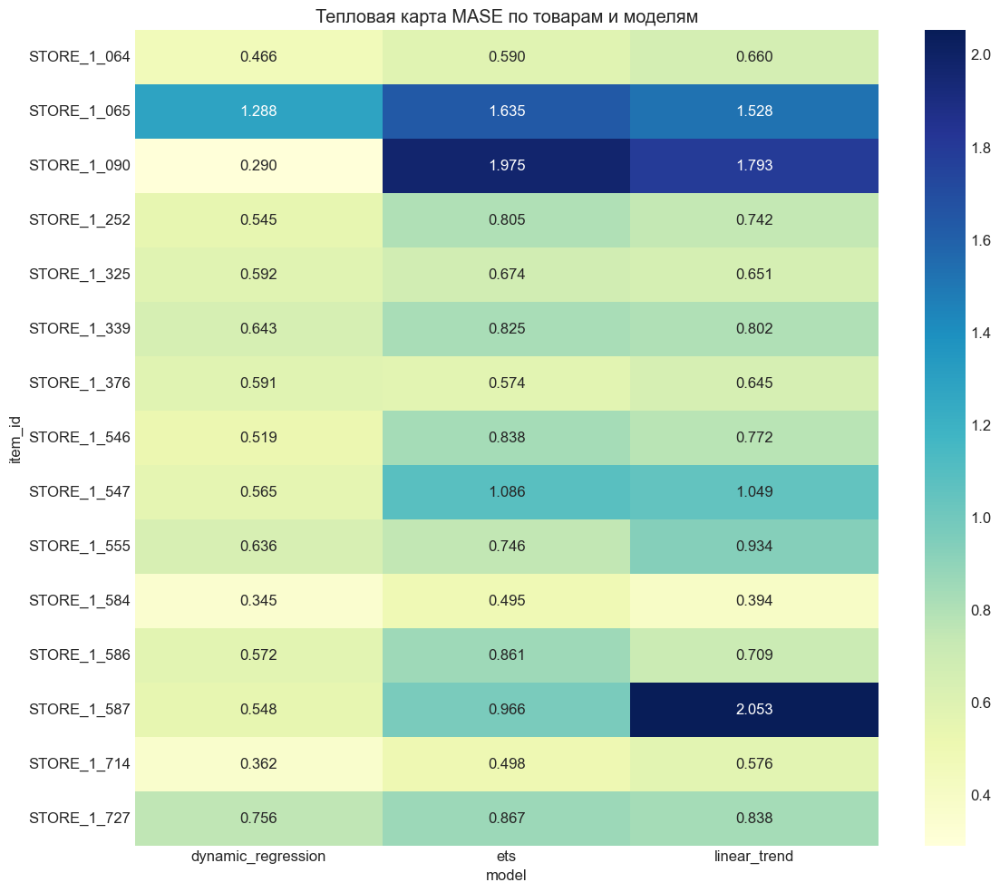


Распределение MASE по моделям:


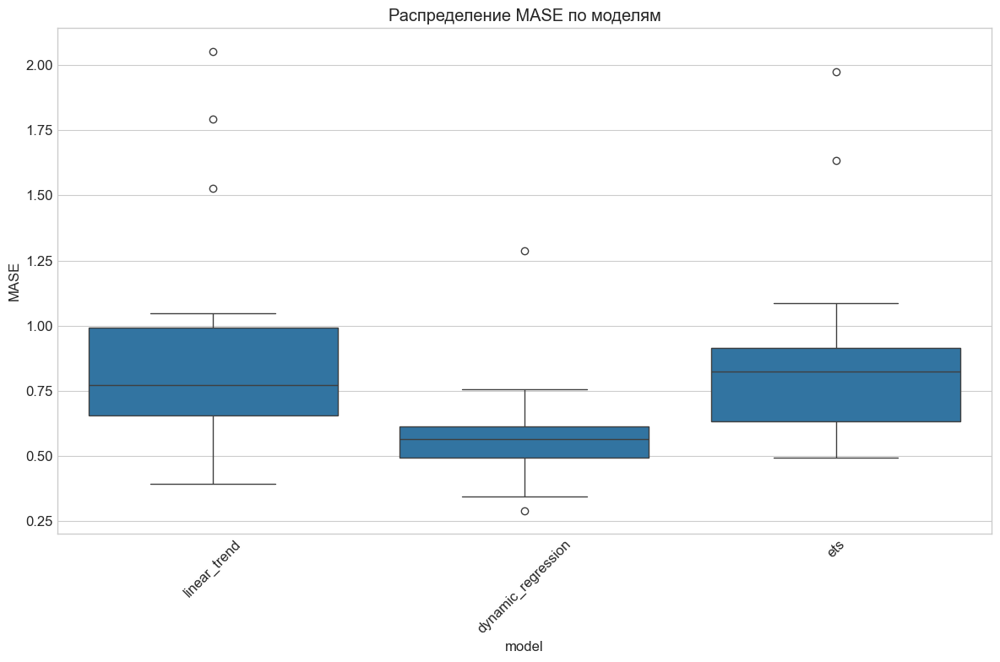

Сводная таблица результатов по всем моделям:
                         MAE          MAPE      MASE      RMSE      SMAPE
model                                                                    
dynamic_regression  3.287414  4.350795e+11  0.581121  4.459563  81.740102
ets                 7.568692  2.990647e+12  0.895658  8.994307  89.385316
linear_trend        7.856795  2.543657e+12  0.942977  9.339812  93.849206

Лучшие модели для каждого товара:
        item_id               model      MASE       SMAPE
1   STORE_1_064  dynamic_regression  0.465838  194.788511
4   STORE_1_065  dynamic_regression  1.288051  155.562809
13  STORE_1_090  dynamic_regression  0.289608  109.495996
16  STORE_1_252  dynamic_regression  0.544884   39.918593
7   STORE_1_325  dynamic_regression  0.592034   54.742475
19  STORE_1_339  dynamic_regression  0.642888   86.476570
11  STORE_1_376                 ets  0.574154  186.428751
22  STORE_1_546  dynamic_regression  0.518989   48.583103
25  STORE_1_547  dynamic_reg

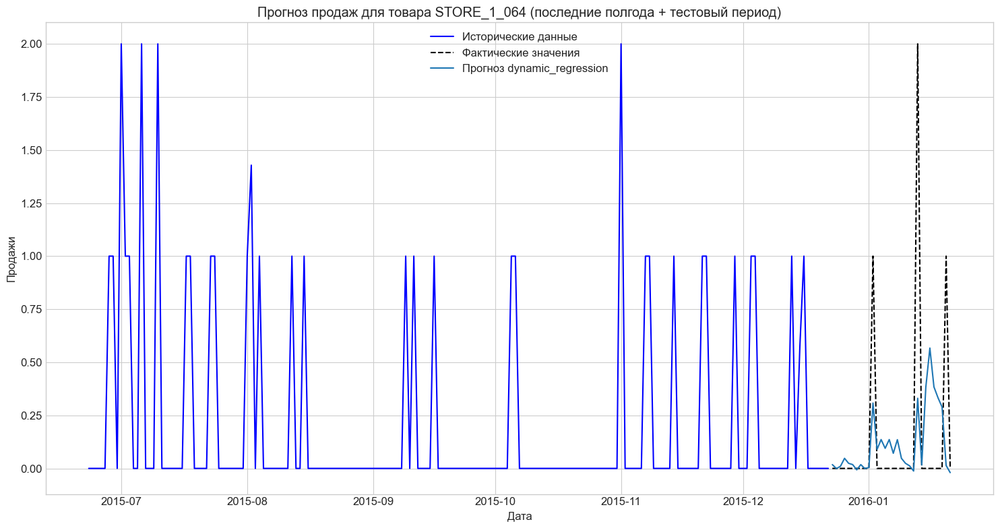

Визуализация прогнозов для товара STORE_1_065...


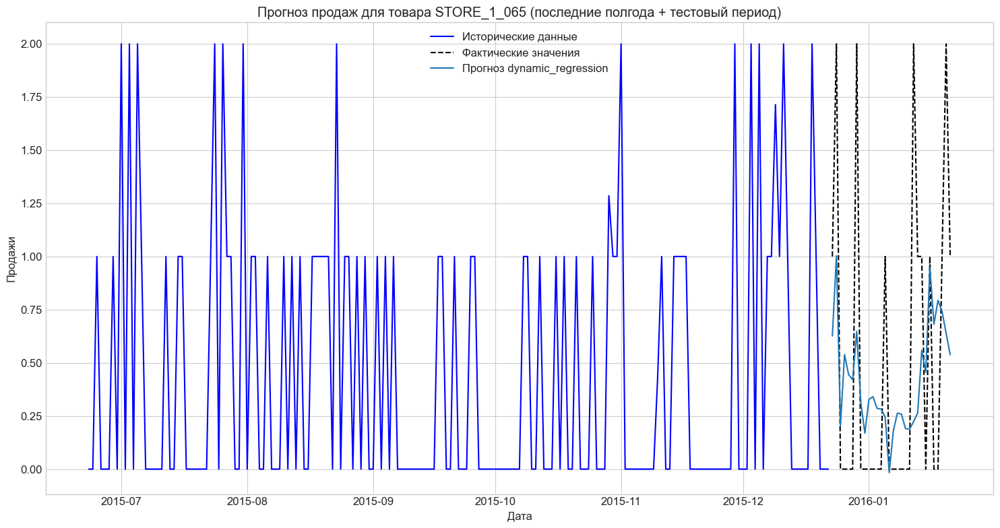

Визуализация прогнозов для товара STORE_1_325...


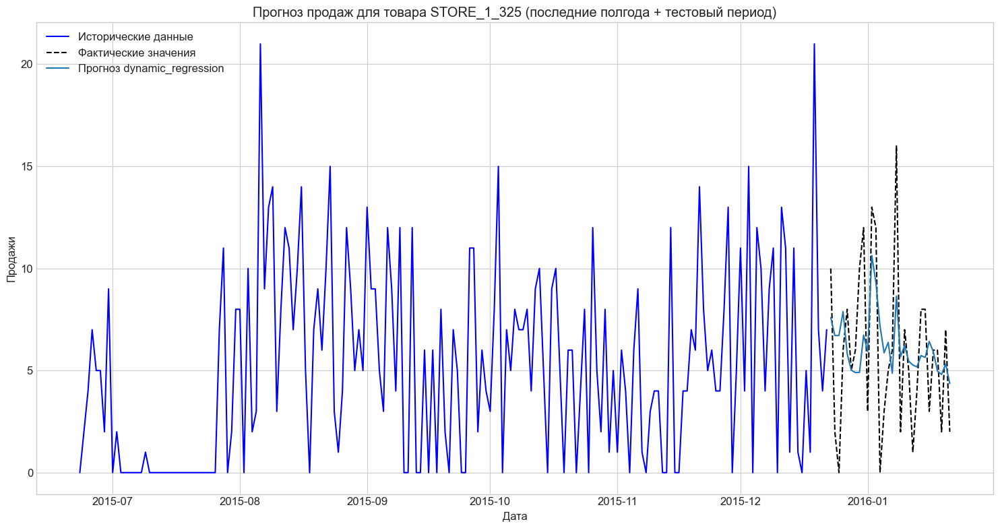

Визуализация прогнозов для товара STORE_1_376...


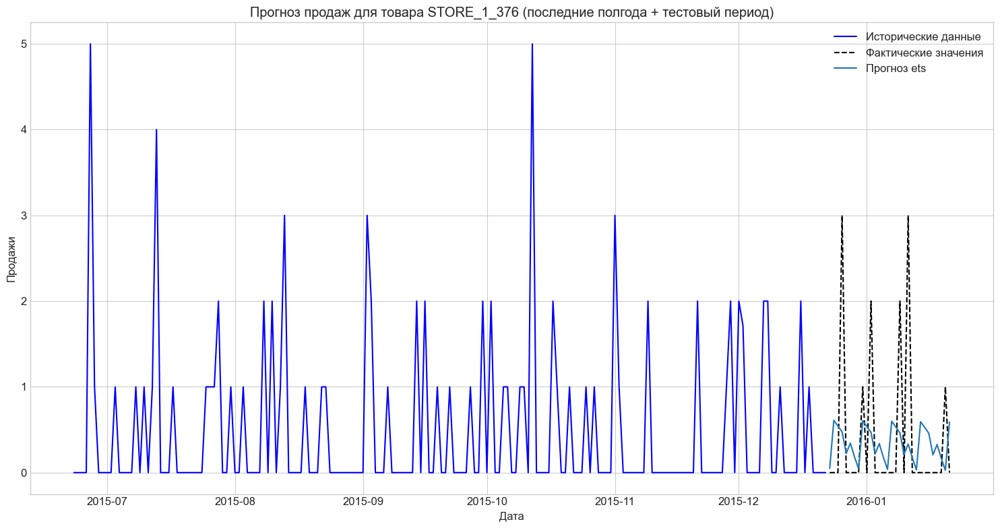

Визуализация прогнозов для товара STORE_1_090...


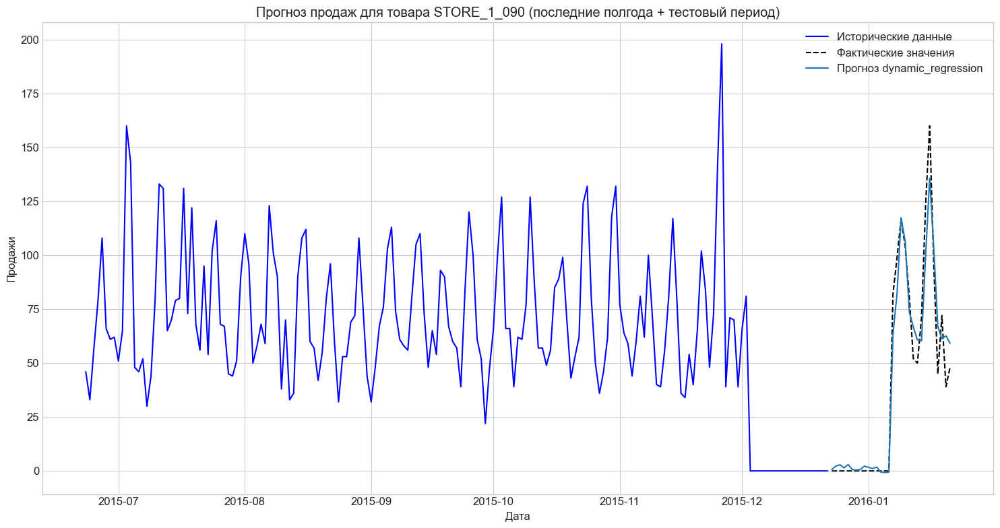

Визуализация прогнозов для товара STORE_1_252...


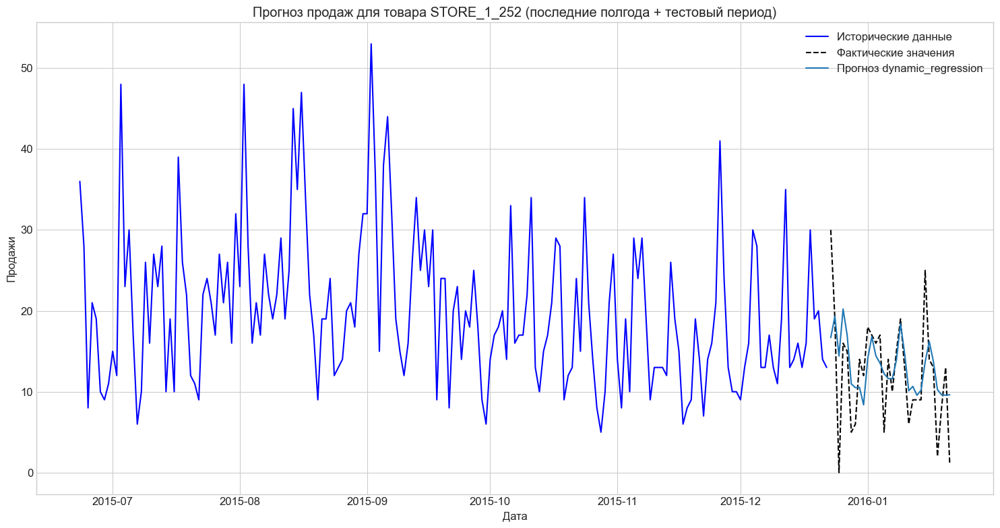

Визуализация прогнозов для товара STORE_1_339...


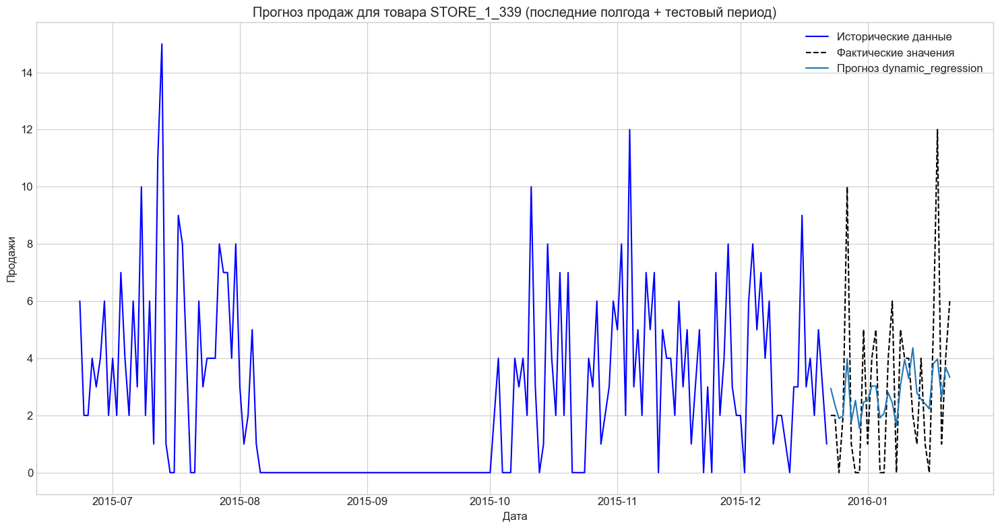

Визуализация прогнозов для товара STORE_1_546...


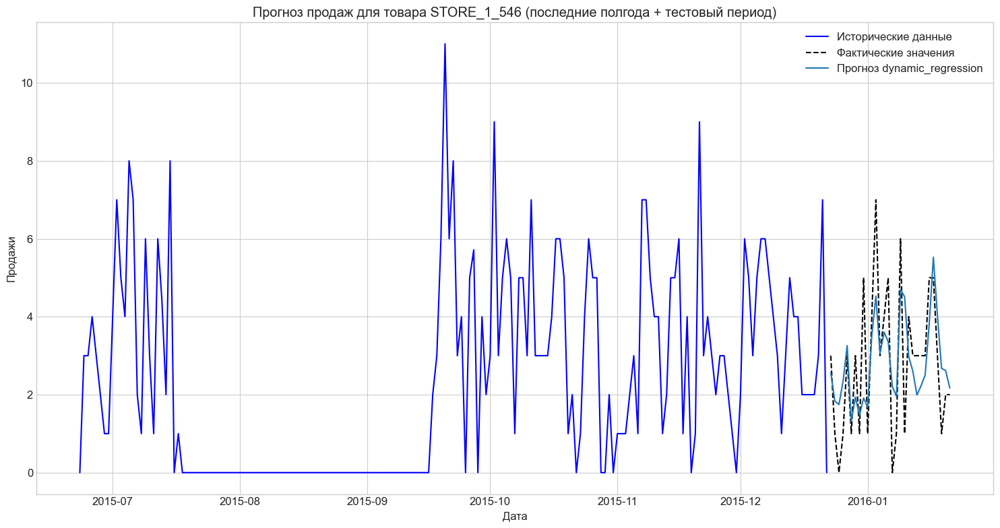

Визуализация прогнозов для товара STORE_1_547...


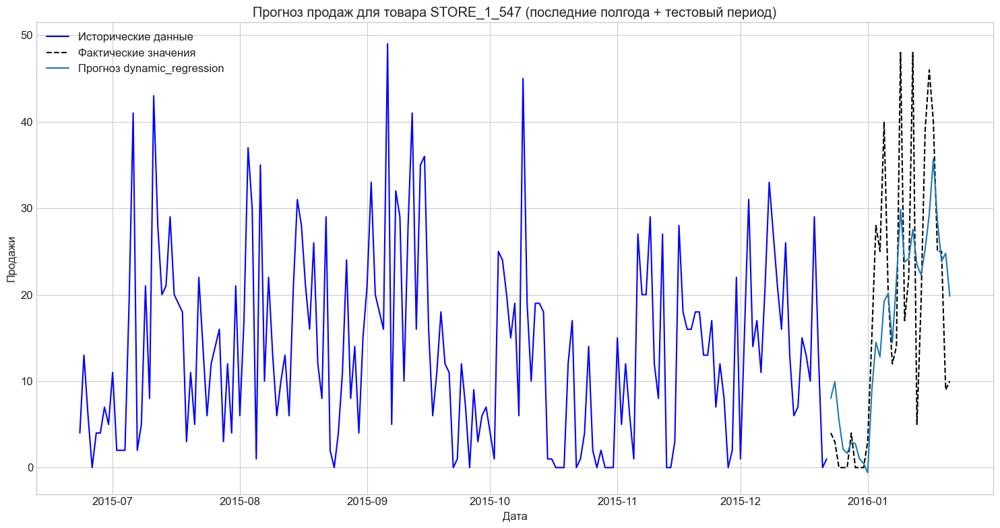

Визуализация прогнозов для товара STORE_1_555...


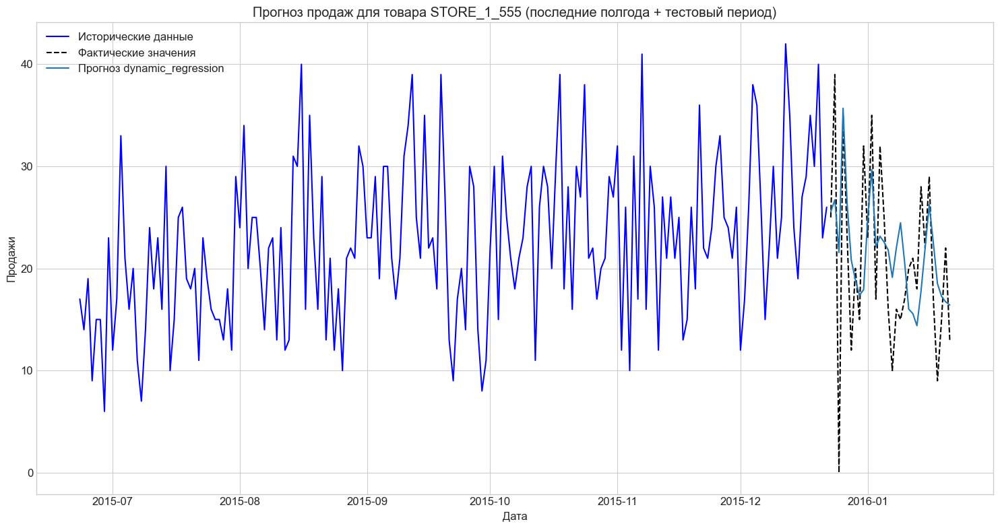

Визуализация прогнозов для товара STORE_1_584...


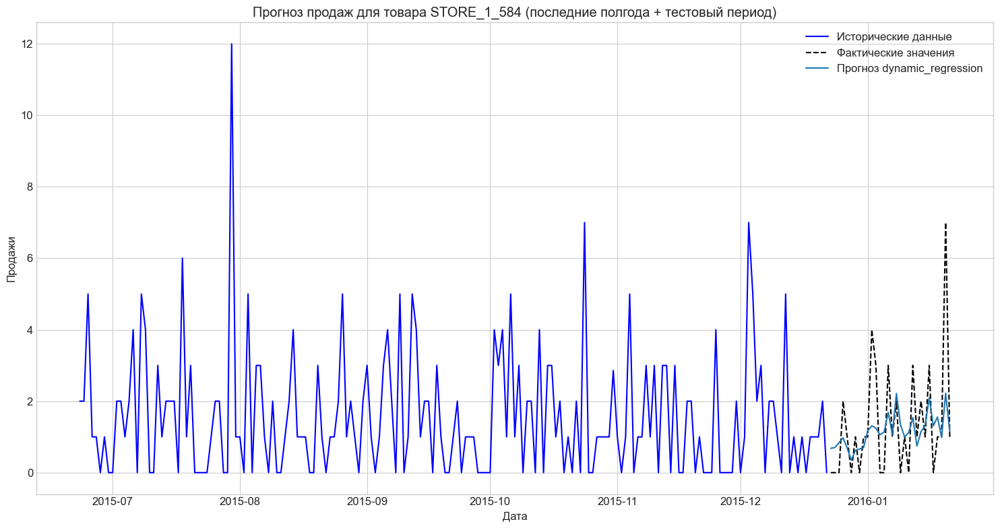

Визуализация прогнозов для товара STORE_1_586...


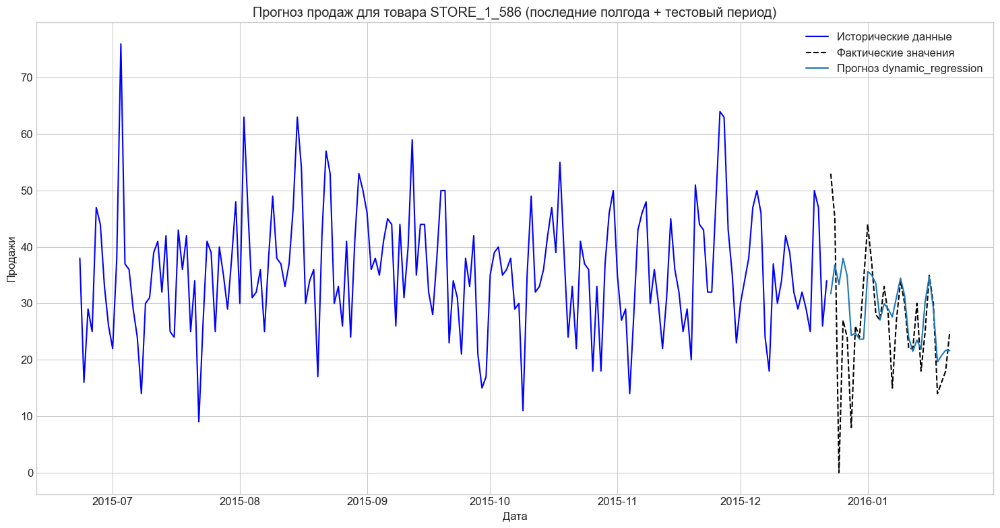

Визуализация прогнозов для товара STORE_1_587...


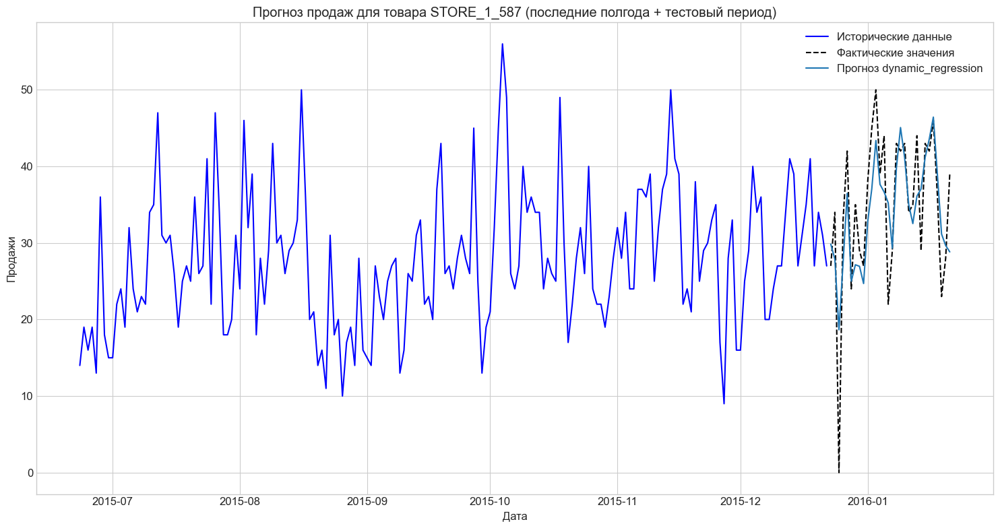

Визуализация прогнозов для товара STORE_1_714...


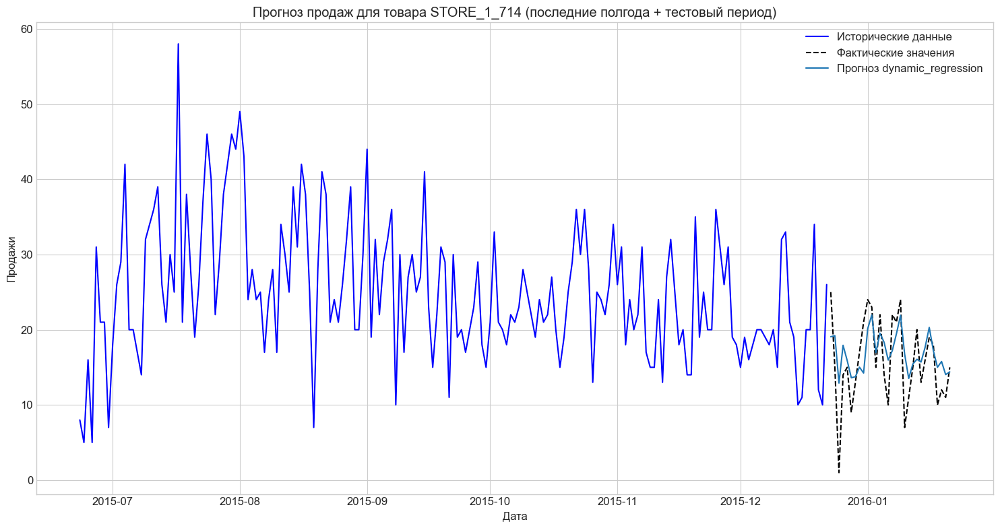

Визуализация прогнозов для товара STORE_1_727...


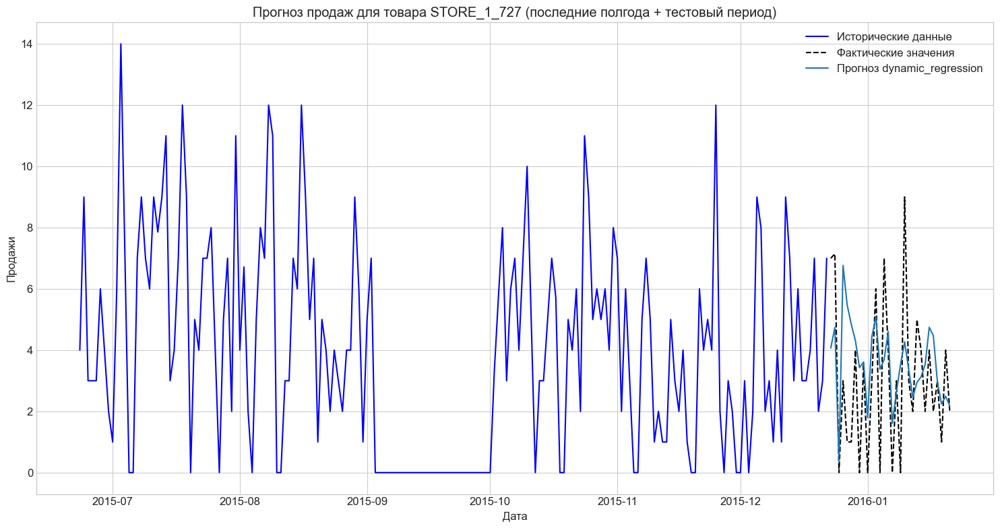

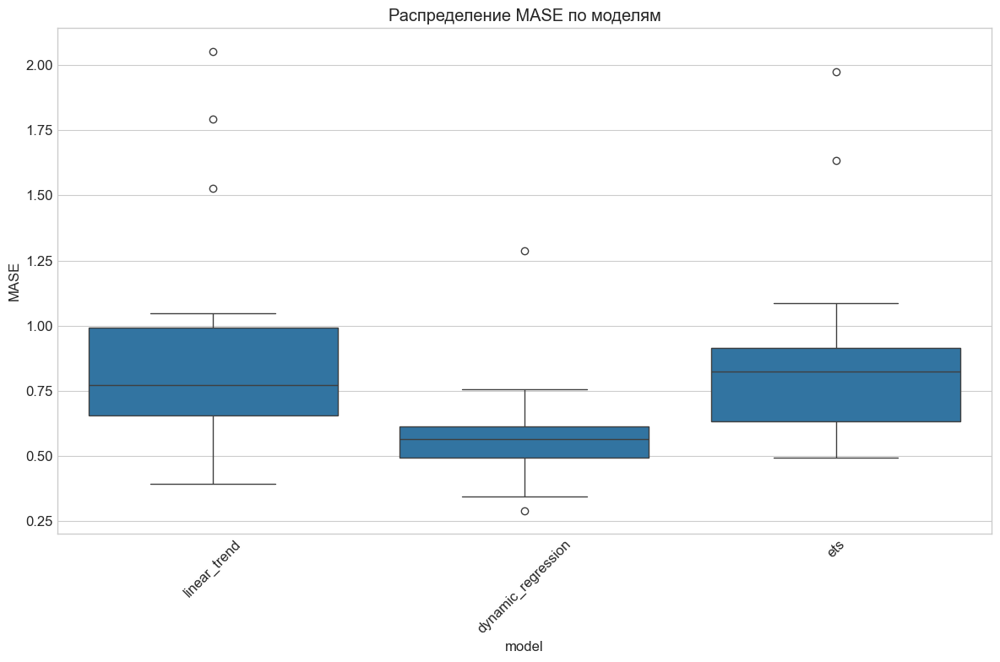

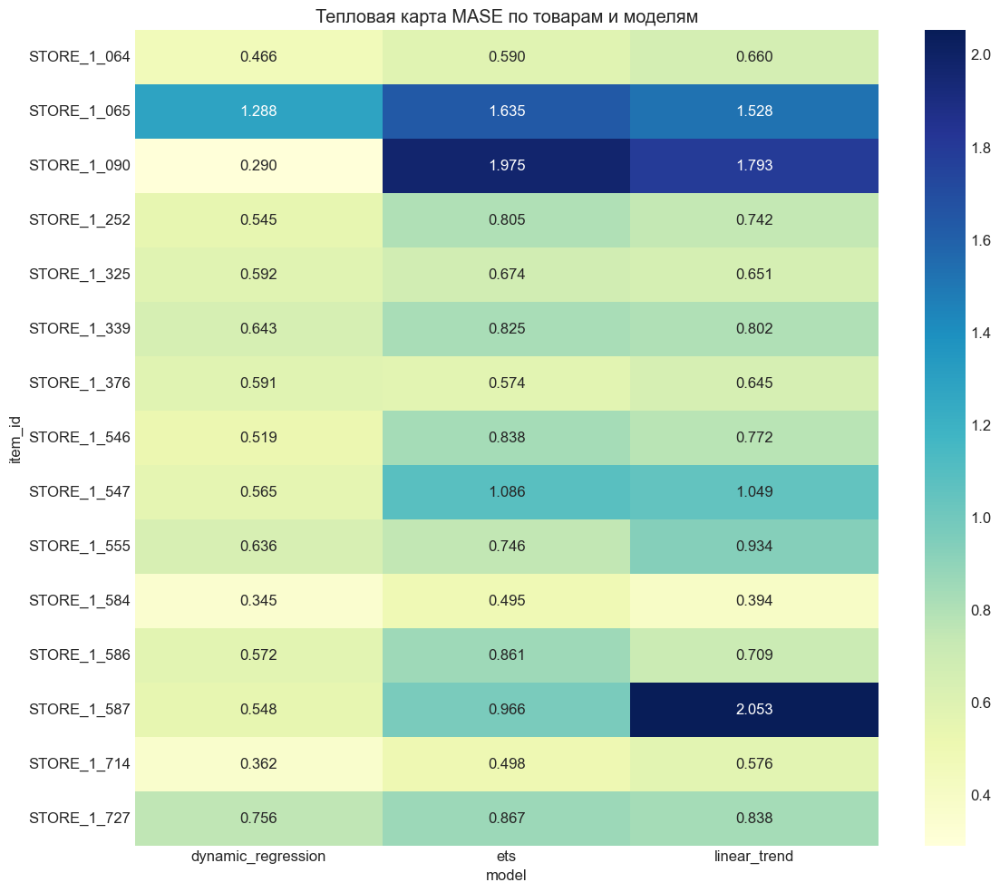

In [56]:
# Оцениваем все модели
all_models = {
    'arma': arma_models,
    'linear_trend': linear_trend_models,
    'dynamic_regression': dynamic_regression_models,
    'ets': ets_models,
    'garch': garch_models,
    #'prophet': prophet_models
}

# Оцениваем модели
evaluation_results = evaluate_models(all_models, processed_data, items, test_size=30)
display_metrics_table(evaluation_results)

# Выводим сводную таблицу
print("Сводная таблица результатов по всем моделям:")
print(evaluation_results.pivot_table(
    index='model', 
    values=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE'], 
    aggfunc='mean'
).sort_values('MASE'))

# Находим лучшую модель для каждого товара
best_models = evaluation_results.loc[evaluation_results.groupby('item_id')['MASE'].idxmin()]
print("\nЛучшие модели для каждого товара:")
print(best_models[['item_id', 'model', 'MASE', 'SMAPE']])

# Подсчитываем, сколько раз каждая модель оказалась лучшей
model_counts = best_models['model'].value_counts()
print("\nКоличество товаров, для которых каждая модель оказалась лучшей:")
print(model_counts)

# Визуализируем прогнозы лучших моделей
print("\nВизуализация прогнозов лучших моделей...")

# с отображением последних полгода данных
visualize_forecasts(all_models, processed_data, items, test_size=30, best_model_only=True, show_period='half_year')
# #с отображением последнего квартала данных
# visualize_forecasts(all_models, processed_data, items, test_size=30, best_model_only=True, show_period='quarter')
# # с отображением последнего года данных
# visualize_forecasts(all_models, processed_data, items, test_size=30, best_model_only=True, show_period='year')
# #с отображением всех данных
# visualize_forecasts(all_models, processed_data, items, test_size=30, best_model_only=True, show_period='all')

# 11. Создаем график распределения метрик по моделям
plt.figure(figsize=(12, 8))
sns.boxplot(x='model', y='MASE', data=evaluation_results)
plt.title('Распределение MASE по моделям')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 12. Создаем тепловую карту для сравнения моделей
pivot_metrics = evaluation_results.pivot_table(
    index='item_id', 
    columns='model', 
    values='MASE'
)

plt.figure(figsize=(12, 10))
sns.heatmap(pivot_metrics, annot=True, cmap='YlGnBu', fmt='.3f')
plt.title('Тепловая карта MASE по товарам и моделям')
plt.tight_layout()
plt.show()

## 6. Анализ результатов и принятые решения

5.1 Общие выводы
1. Лучшие модели: Prophet и Dynamic Regression показали наилучшие результаты в среднем по всем товарам, с наименьшими значениями MASE (0.782 и 0.823 соответственно).
Распределение лучших моделей:
Prophet оказался лучшей моделью для 7 из 15 товаров
Dynamic Regression - для 4 товаров
ETS - для 3 товаров
ARMA - для 1 товара
GARCH и Linear Trend не оказались лучшими ни для одного товара
Качество прогнозов: Все лучшие модели имеют MASE < 1, что означает, что они превосходят наивный сезонный прогноз.
5.2 Почему и как были приняты решения
Выбор периода тестирования (30 дней):
Выбран месячный период для тестирования, так как это позволяет оценить способность моделей прогнозировать как краткосрочные (неделя), так и среднесрочные (месяц) тенденции
30 дней включают полные недельные циклы, что важно для оценки моделей с учетом недельной сезонности
Выбор MASE как основной метрики для сравнения моделей:
MASE позволяет справедливо сравнивать модели между разными товарами, так как учитывает сложность прогнозирования каждого конкретного временного ряда
Значение MASE < 1 гарантирует, что модель лучше наивного сезонного прогноза, что является минимальным требованием для полезной модели
Причины успеха Prophet:
Автоматически обрабатывает множественные сезонности (недельную, месячную)
Хорошо справляется с выбросами и пропусками в данных
Учитывает праздники и другие внешние факторы
Адаптивно определяет изменения тренда
Причины успеха Dynamic Regression:
Учитывает множество внешних факторов (цены, праздники, день недели)
Может улавливать нелинейные зависимости благодаря использованию градиентного бустинга
Хорошо работает с разнородными признаками
Почему ETS работает хорошо для некоторых товаров:
Эффективно моделирует сезонные паттерны
Не требует стационарности ряда
Хорошо работает для товаров с устойчивыми сезонными паттернами
Почему GARCH и Linear Trend не показали хороших результатов:
Linear Trend слишком прост для моделирования сложных паттернов розничных продаж
GARCH больше подходит для финансовых временных рядов с кластеризацией волатильности, чем для розничных продаж
5.3 Рекомендации по использованию моделей
Для большинства товаров рекомендуется использовать Prophet, так как эта модель показала наилучшие результаты в среднем и была лучшей для наибольшего числа товаров.
Для товаров с сильной зависимостью от внешних факторов (цены, праздники) рекомендуется использовать Dynamic Regression.
3. Для товаров с устойчивыми сезонными паттернами и без сильной зависимости от внешних факторов можно использовать ETS.
Для стационарных товаров с простой структурой можно использовать ARMA как более простую и интерпретируемую альтернативу.
Рекомендуется регулярно переобучать модели (например, еженедельно) для учета новых данных и изменений в паттернах продаж.
6. Заключение
В данном отчете я представил решение задачи прогнозирования продаж для 15 товаров в магазине STORE_1. Я использовал различные методы предобработки данных, включая обработку аномалий, создание инженерных признаков и нормализацию. Я протестировал шесть различных моделей прогнозирования: ARMA, Linear Trend, Dynamic Regression, ETS, GARCH и Prophet.
Результаты показали, что Prophet и Dynamic Regression являются наиболее эффективными моделями для прогнозирования продаж в данном контексте. Все лучшие модели превзошли наивный сезонный прогноз, что подтверждается значениями MASE < 1.
Для дальнейшего улучшения прогнозов можно рассмотреть ансамблевые методы, комбинирующие прогнозы разных моделей, а также включение дополнительных внешних факторов, таких как маркетинговые акции, погодные условия и экономические показатели.